# ELAIS-N1: Validation Checks (FULL)

In [1]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools

import time


In [2]:
t0 = time.time()

catname = "../../dmu1/dmu1_ml_ELAIS-N1/data/master_catalogue_elais-n1_20171016.fits"
master_catalogue = Table.read(catname)

print('Elapsed time(secs): ', time.time() - t0)

print("Number of sources in master catalogue: ", len(master_catalogue))

Elapsed time(secs):  90.4409601688385
Number of sources in master catalogue:  4026292


In [3]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

ELAIS-N1


In [4]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

In [5]:
u_bands = ["WFC u", "Megacam u"]
g_bands = ["WFC g", "Megacam g", "SUPRIME g", "GPC1 g"]
r_bands = ["WFC r", "Megacam r", "SUPRIME r", "GPC1 r"]
i_bands = ["WFC i",              "SUPRIME i", "GPC1 i"]
z_bands = ["WFC z", "Megacam z", "SUPRIME z", "GPC1 z"]
y_bands = [                      "SUPRIME y", "GPC1 y"]

all_bands = [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands

ir_mags = ["UKIDSS J", "UKIDSS K", "IRAC i1", "IRAC i2", "IRAC i3", "IRAC i4"]

all_mags = opt_mags + ir_mags

## 1/ Magnitude errors

In [6]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")


    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    #ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    #ax.get_xaxis().get_major_formatter().labelOnlyBase = False
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
    #plt.show()
        

WFC u mag (aperture)
    Error max: 213
    magerr > 10: Number of objects = 19, min mag = 26.8
    magerr > 100: Number of objects = 2, min mag = 30.9
    magerr > 1000: Number of objects = 0, min mag = nan

WFC u mag (total)
    Error max: 62
    magerr > 10: Number of objects = 37, min mag = 27.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



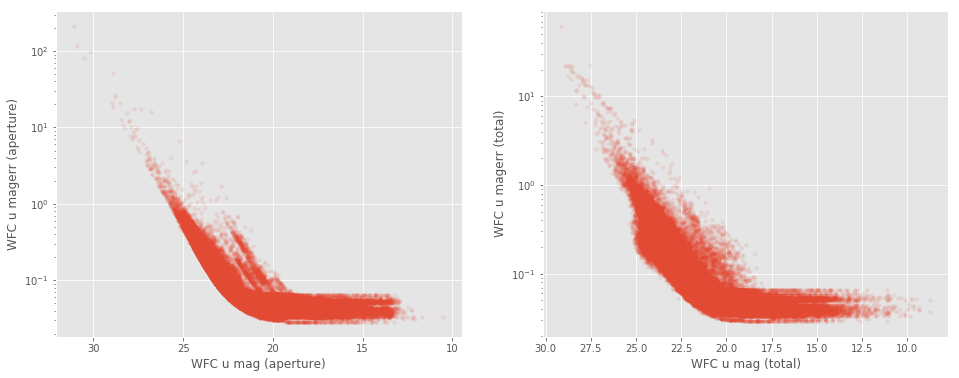

Megacam u mag (aperture)
    Error max: 90
    magerr > 10: Number of objects = 611, min mag = 30.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam u mag (total)
    Error max: 90
    magerr > 10: Number of objects = 2177, min mag = 29.4
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



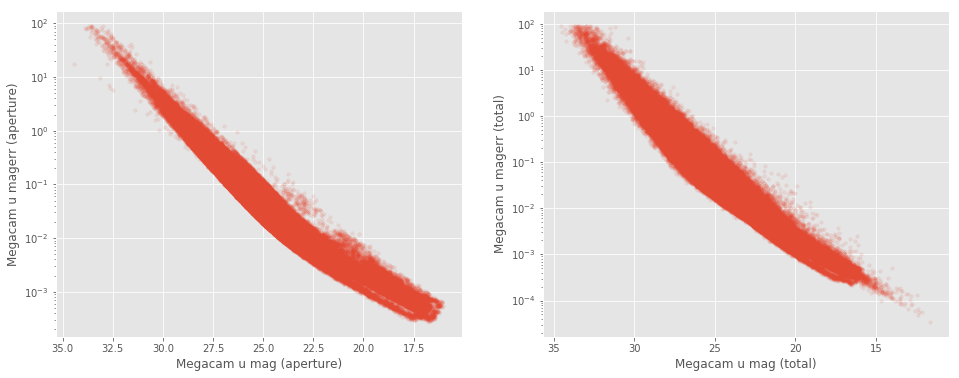

WFC g mag (aperture)
    Error max: 225
    magerr > 10: Number of objects = 9, min mag = 27.4
    magerr > 100: Number of objects = 1, min mag = 30.0
    magerr > 1000: Number of objects = 0, min mag = nan

WFC g mag (total)
    Error max: 346
    magerr > 10: Number of objects = 80, min mag = 27.7
    magerr > 100: Number of objects = 6, min mag = 30.3
    magerr > 1000: Number of objects = 0, min mag = nan



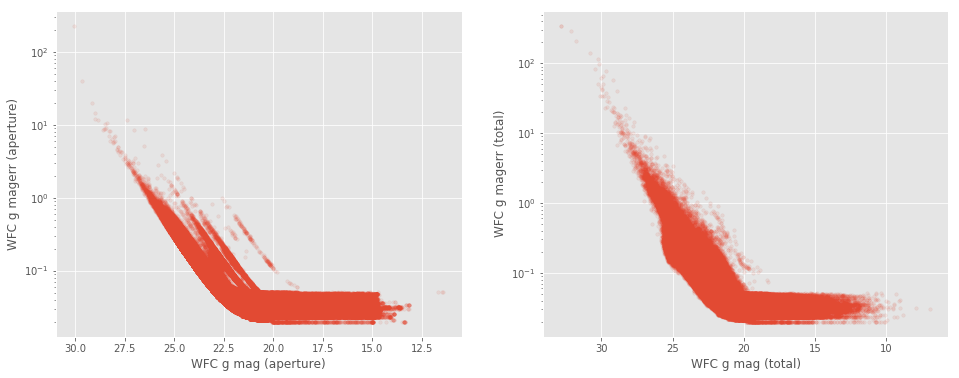

Megacam g mag (aperture)
    Error max: 64
    magerr > 10: Number of objects = 53, min mag = 31.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam g mag (total)
    Error max: 81
    magerr > 10: Number of objects = 201, min mag = 29.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



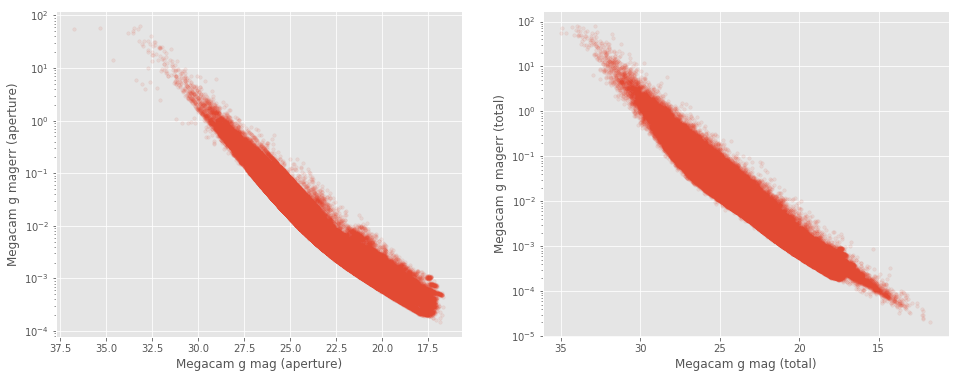

SUPRIME g mag (aperture)
    Error max: 24436995967156224
    magerr > 10: Number of objects = 21816, min mag = 29.5
    magerr > 100: Number of objects = 10090, min mag = 32.0
    magerr > 1000: Number of objects = 5368, min mag = 34.6

SUPRIME g mag (total)
    Error max: 78052751048704
    magerr > 10: Number of objects = 16057, min mag = 27.6
    magerr > 100: Number of objects = 5278, min mag = 30.3
    magerr > 1000: Number of objects = 2486, min mag = 34.1



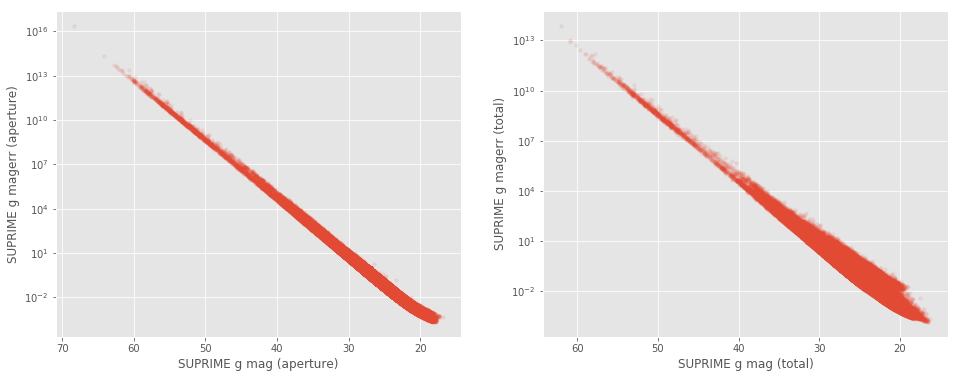

GPC1 g mag (aperture)
    Error max: 7
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 g mag (total)
    Error max: 44
    magerr > 10: Number of objects = 5, min mag = 27.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



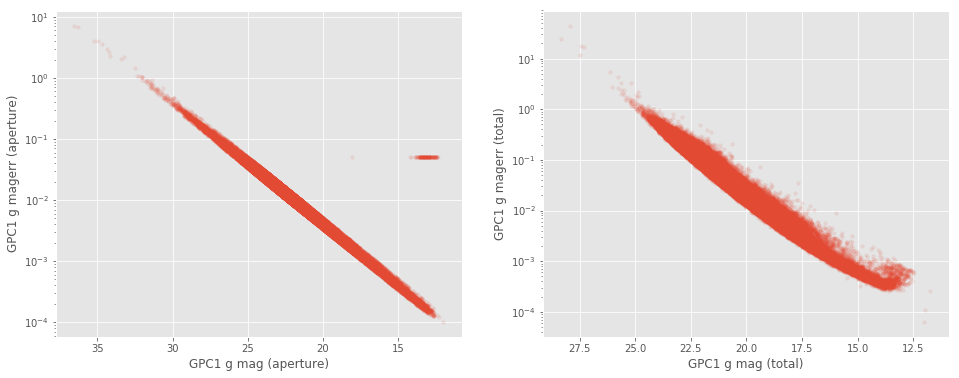

WFC r mag (aperture)
    Error max: 133
    magerr > 10: Number of objects = 12, min mag = 28.1
    magerr > 100: Number of objects = 1, min mag = 30.7
    magerr > 1000: Number of objects = 0, min mag = nan

WFC r mag (total)
    Error max: 642
    magerr > 10: Number of objects = 39, min mag = 27.2
    magerr > 100: Number of objects = 5, min mag = 31.0
    magerr > 1000: Number of objects = 0, min mag = nan



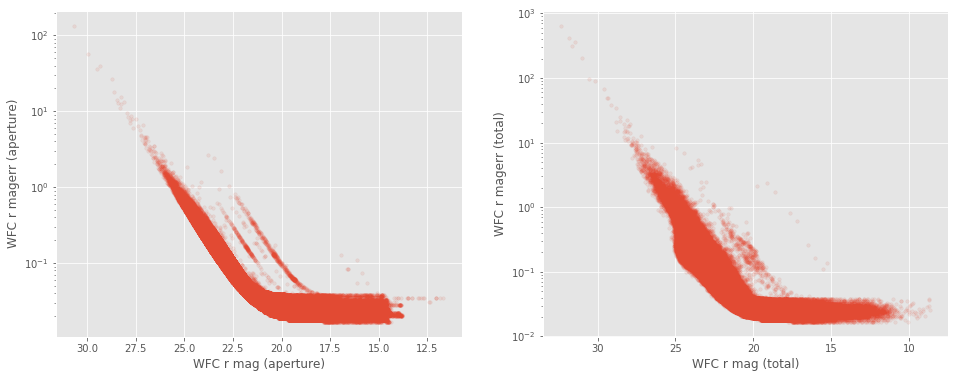

Megacam r mag (aperture)
    Error max: 20
    magerr > 10: Number of objects = 4, min mag = 30.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam r mag (total)
    Error max: 71
    magerr > 10: Number of objects = 21, min mag = 28.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



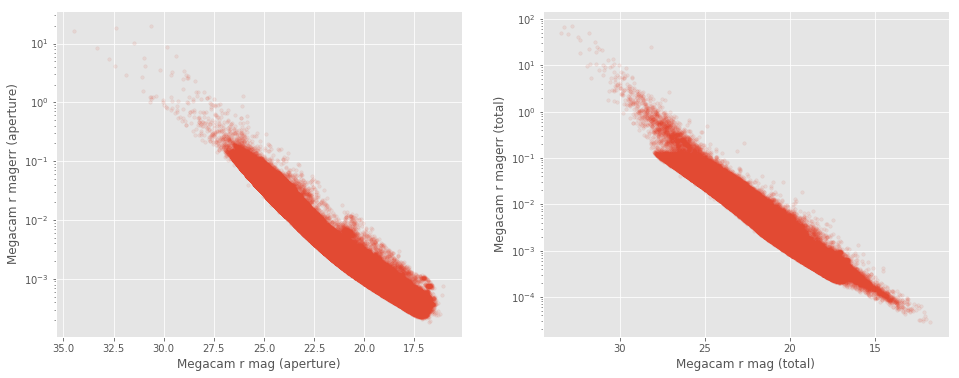

SUPRIME r mag (aperture)
    Error max: 933177073860608
    magerr > 10: Number of objects = 22338, min mag = 29.0
    magerr > 100: Number of objects = 11982, min mag = 31.5
    magerr > 1000: Number of objects = 7102, min mag = 34.0

SUPRIME r mag (total)
    Error max: 96918562668544
    magerr > 10: Number of objects = 17514, min mag = 27.0
    magerr > 100: Number of objects = 6387, min mag = 29.9
    magerr > 1000: Number of objects = 3366, min mag = 33.2



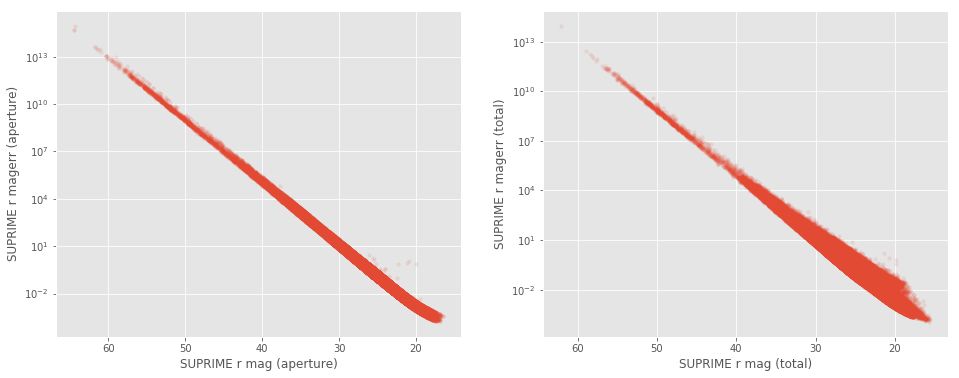

GPC1 r mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 r mag (total)
    Error max: 11
    magerr > 10: Number of objects = 1, min mag = 26.9
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



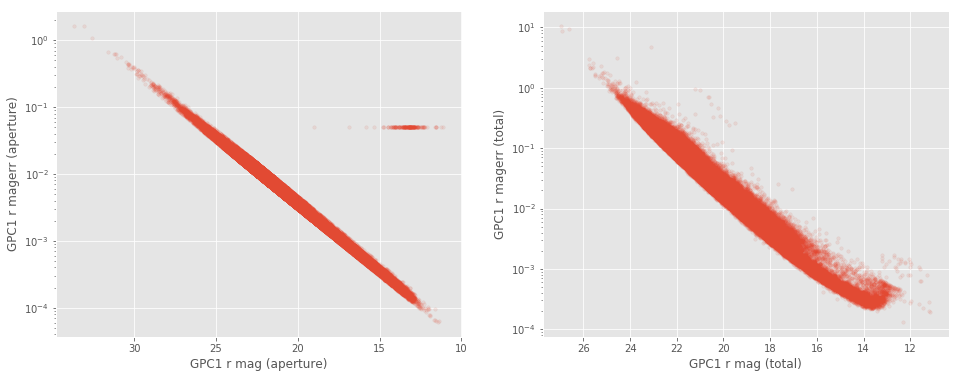

WFC i mag (aperture)
    Error max: 124
    magerr > 10: Number of objects = 10, min mag = 24.1
    magerr > 100: Number of objects = 1, min mag = 30.0
    magerr > 1000: Number of objects = 0, min mag = nan

WFC i mag (total)
    Error max: 476
    magerr > 10: Number of objects = 87, min mag = 22.2
    magerr > 100: Number of objects = 5, min mag = 29.4
    magerr > 1000: Number of objects = 0, min mag = nan



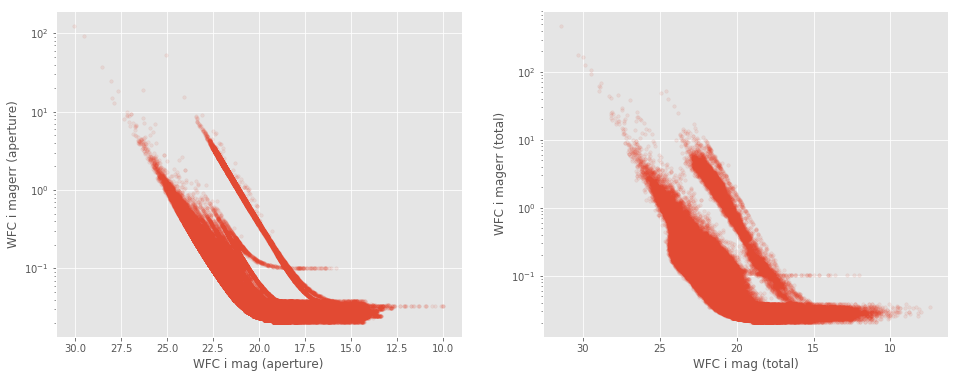

SUPRIME i mag (aperture)
    Error max: 241654857728
    magerr > 10: Number of objects = 3901, min mag = 29.0
    magerr > 100: Number of objects = 1220, min mag = 31.4
    magerr > 1000: Number of objects = 513, min mag = 34.1

SUPRIME i mag (total)
    Error max: 5298569728
    magerr > 10: Number of objects = 7367, min mag = 26.9
    magerr > 100: Number of objects = 977, min mag = 29.6
    magerr > 1000: Number of objects = 198, min mag = 33.4



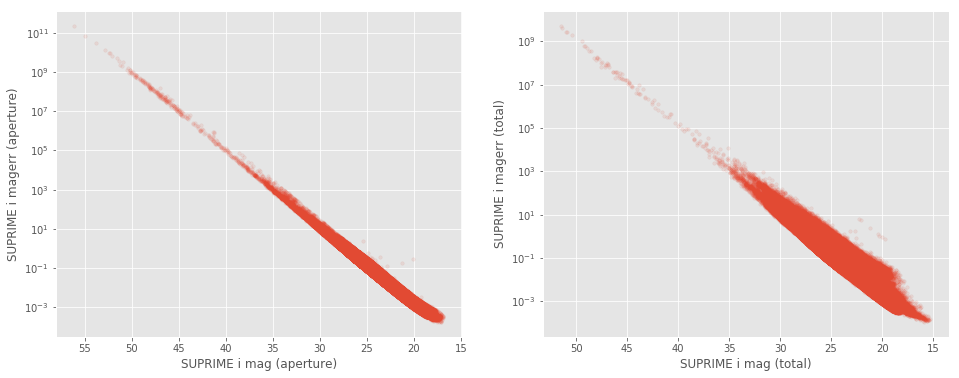

GPC1 i mag (aperture)
    Error max: 1
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 i mag (total)
    Error max: 5
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



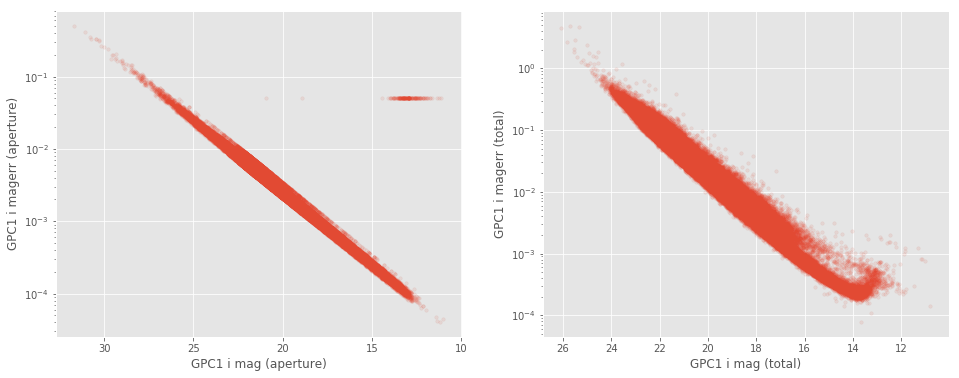

WFC z mag (aperture)
    Error max: 82
    magerr > 10: Number of objects = 28, min mag = 25.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WFC z mag (total)
    Error max: 203
    magerr > 10: Number of objects = 32, min mag = 25.2
    magerr > 100: Number of objects = 2, min mag = 28.1
    magerr > 1000: Number of objects = 0, min mag = nan



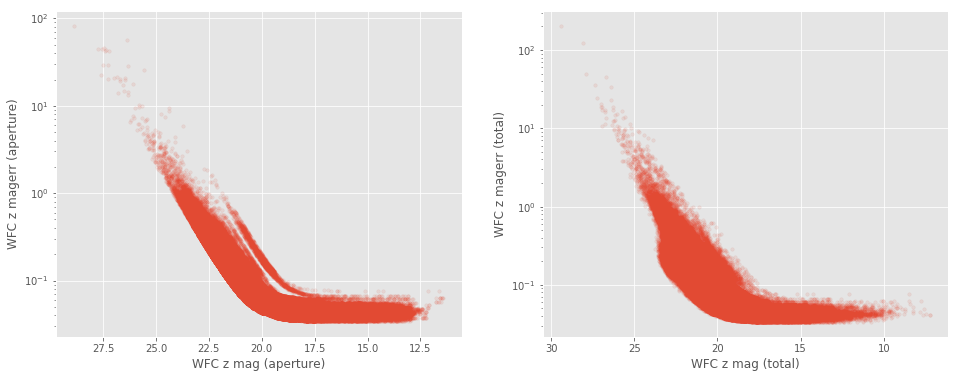

Megacam z mag (aperture)
    Error max: 86
    magerr > 10: Number of objects = 146, min mag = 28.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam z mag (total)
    Error max: 89
    magerr > 10: Number of objects = 1354, min mag = 28.4
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



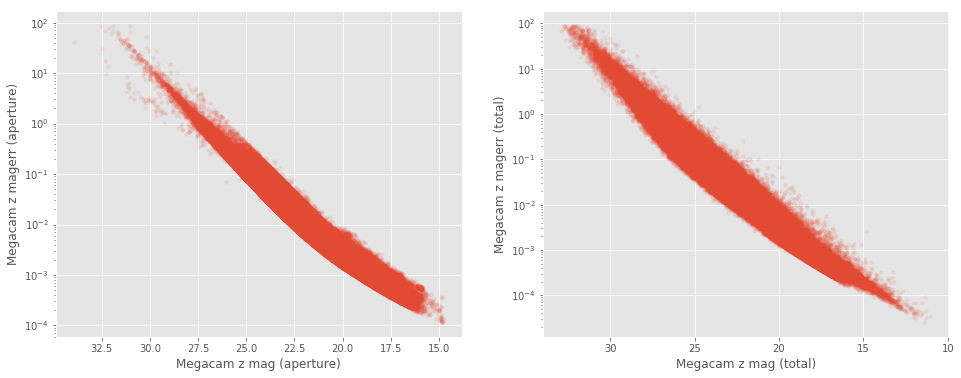

SUPRIME z mag (aperture)
    Error max: 93890199683072
    magerr > 10: Number of objects = 41809, min mag = 26.1
    magerr > 100: Number of objects = 15826, min mag = 28.7
    magerr > 1000: Number of objects = 6350, min mag = 31.2

SUPRIME z mag (total)
    Error max: 9435948777472
    magerr > 10: Number of objects = 29022, min mag = 24.4
    magerr > 100: Number of objects = 7668, min mag = 27.2
    magerr > 1000: Number of objects = 2917, min mag = 31.3



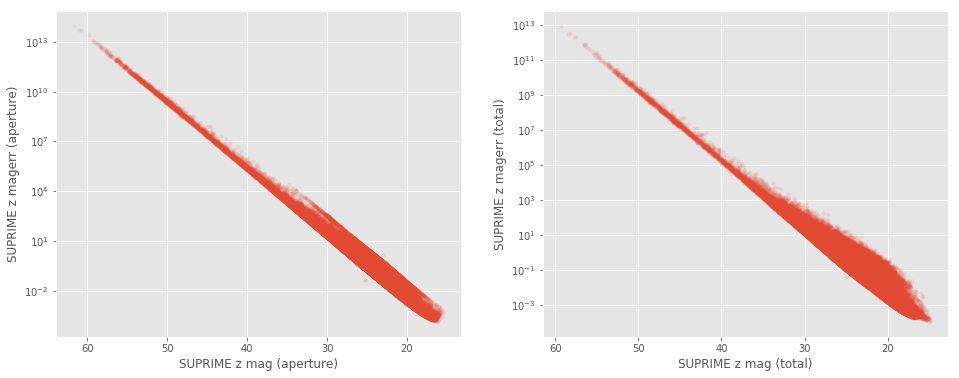

GPC1 z mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 z mag (total)
    Error max: 22
    magerr > 10: Number of objects = 1, min mag = 26.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



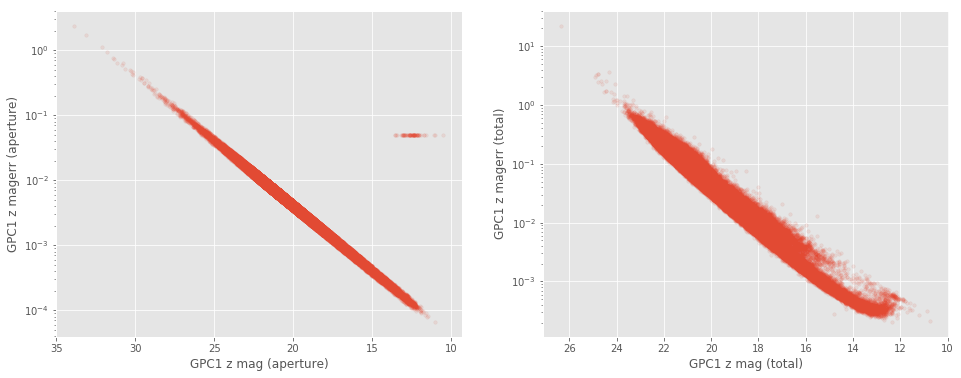

SUPRIME y mag (aperture)
    Error max: 280796004352
    magerr > 10: Number of objects = 87875, min mag = 27.1
    magerr > 100: Number of objects = 32204, min mag = 29.6
    magerr > 1000: Number of objects = 10032, min mag = 32.2

SUPRIME y mag (total)
    Error max: 39437291520
    magerr > 10: Number of objects = 53122, min mag = 24.0
    magerr > 100: Number of objects = 12638, min mag = 27.9
    magerr > 1000: Number of objects = 3561, min mag = 30.7



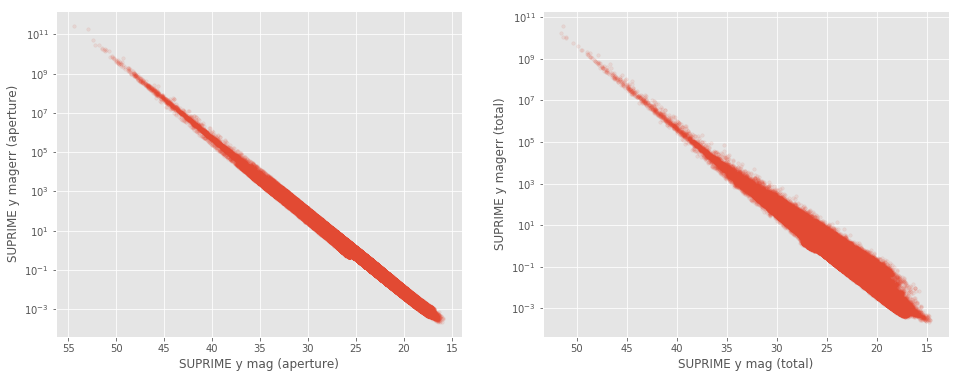

GPC1 y mag (aperture)
    Error max: 4
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 y mag (total)
    Error max: 16
    magerr > 10: Number of objects = 1, min mag = 25.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



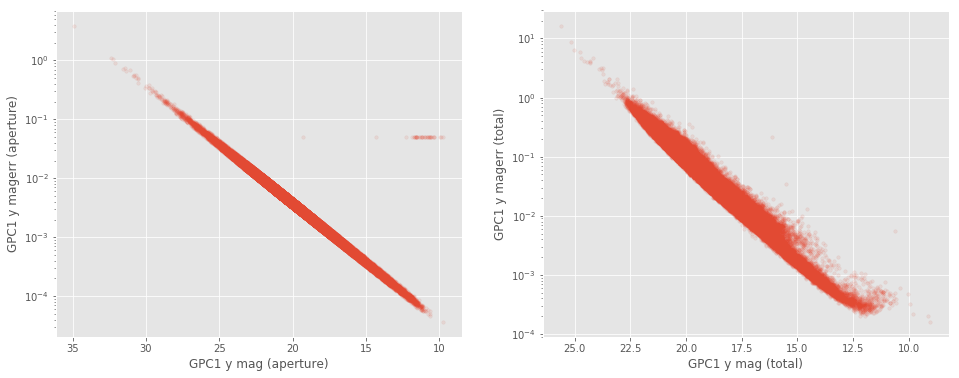

UKIDSS J mag (aperture)
    Error max: 54
    magerr > 10: Number of objects = 15, min mag = 27.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS J mag (total)
    Error max: 270
    magerr > 10: Number of objects = 89, min mag = 26.5
    magerr > 100: Number of objects = 6, min mag = 29.0
    magerr > 1000: Number of objects = 0, min mag = nan



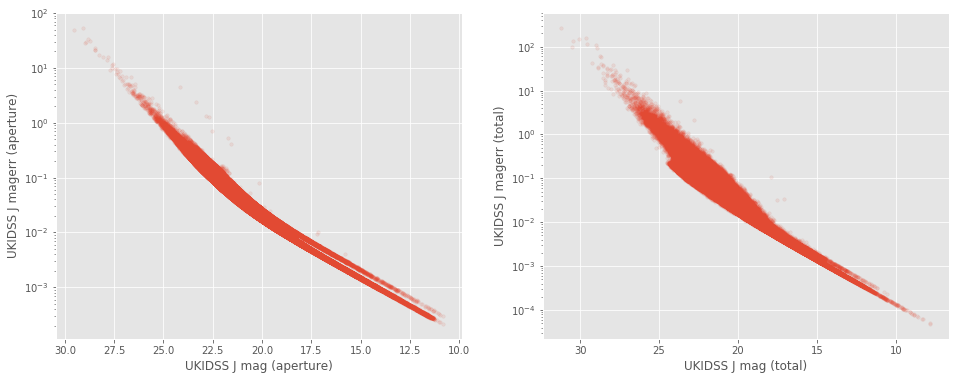

UKIDSS K mag (aperture)
    Error max: 3083
    magerr > 10: Number of objects = 17, min mag = 26.1
    magerr > 100: Number of objects = 1, min mag = 33.4
    magerr > 1000: Number of objects = 1, min mag = 33.4

UKIDSS K mag (total)
    Error max: 122398
    magerr > 10: Number of objects = 77, min mag = 25.8
    magerr > 100: Number of objects = 4, min mag = 29.0
    magerr > 1000: Number of objects = 2, min mag = 31.8



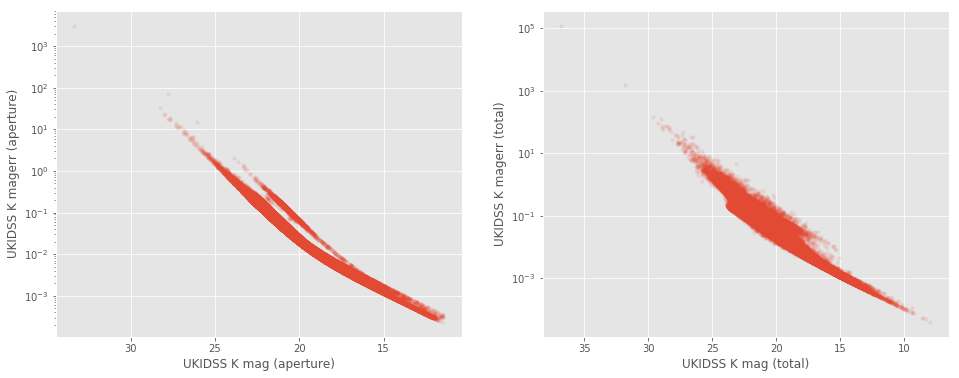

IRAC i1 mag (aperture)
    Error max: 3642
    magerr > 10: Number of objects = 370, min mag = 19.2
    magerr > 100: Number of objects = 37, min mag = 22.4
    magerr > 1000: Number of objects = 3, min mag = 24.4

IRAC i1 mag (total)
    Error max: 18220
    magerr > 10: Number of objects = 369, min mag = 18.9
    magerr > 100: Number of objects = 36, min mag = 21.4
    magerr > 1000: Number of objects = 3, min mag = 25.6



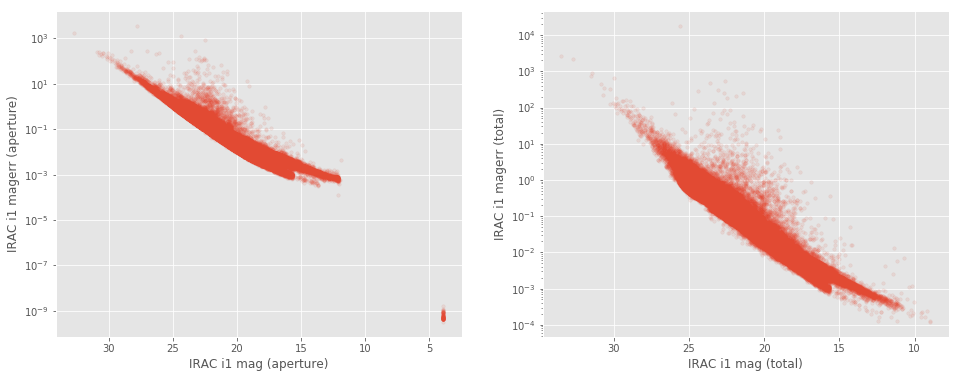

IRAC i2 mag (aperture)
    Error max: 18880
    magerr > 10: Number of objects = 459, min mag = 19.7
    magerr > 100: Number of objects = 34, min mag = 22.5
    magerr > 1000: Number of objects = 2, min mag = 32.3

IRAC i2 mag (total)
    Error max: 5232
    magerr > 10: Number of objects = 287, min mag = 17.9
    magerr > 100: Number of objects = 23, min mag = 23.3
    magerr > 1000: Number of objects = 3, min mag = 31.5



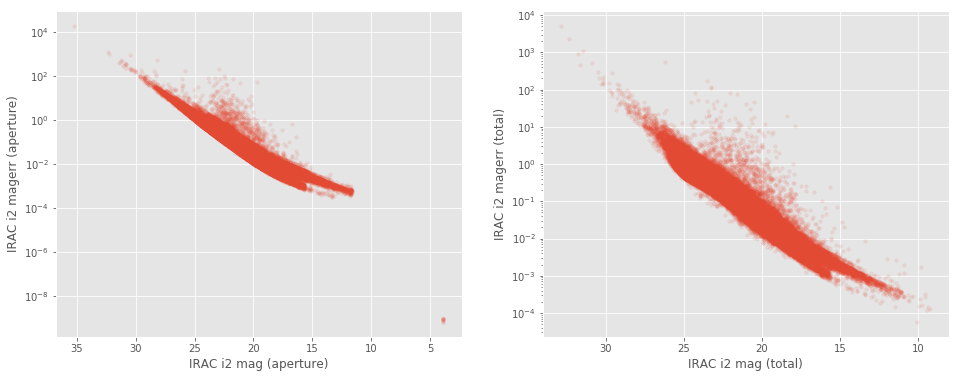

IRAC i3 mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i3 mag (total)
    Error max: 4
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



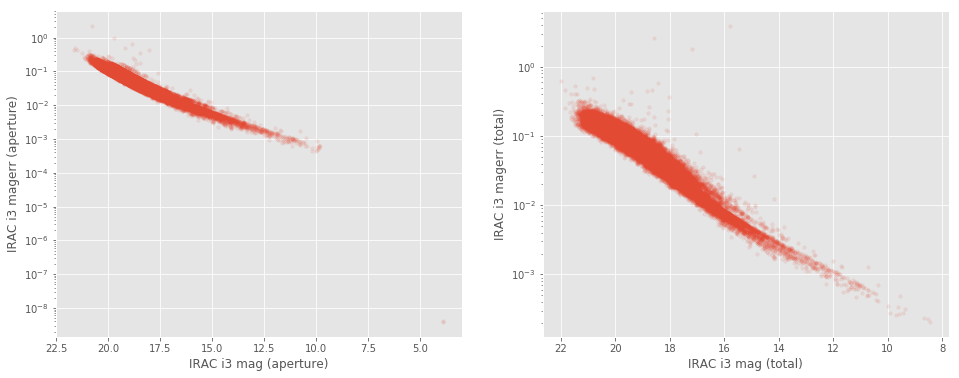

IRAC i4 mag (aperture)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i4 mag (total)
    Error max: 2
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



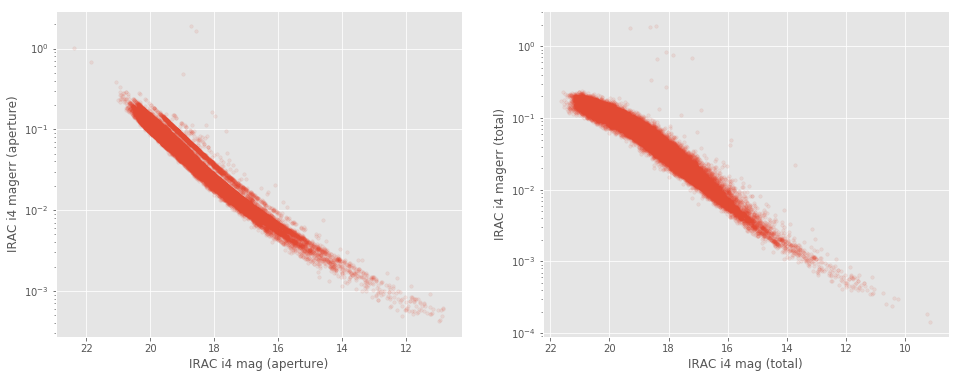

In [8]:
for mag in all_mags:
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    
    basecol = mag.replace(" ", "_").lower()
    
    if basecol == "megacam_u" or basecol == "suprime_g":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2/ Magnitude and error issues

In [16]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None, mask3=None,
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             savefig=False):

    if nb == 2 or (nb == 1 and x3 is None):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    else:
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None and nb >= 2:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    if nb == 1:
        # IRAC mag
        ax2.set_yscale('log')    # to place before scatter to avoid issues
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask2], y2[mask2], 'b.')
        ax2.invert_xaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
        
    if nb == 1 and x3 is not None:
        # IRAC mag with i3
        ax3.set_yscale('log')    # to place before scatter to avoid issues
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask3], y2[mask3], 'b.')
        ax3.invert_xaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Comparing magnitudes
    if nb >= 2:
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask], y2[mask], 'b.')
        if mask2 is not None:
            ax2.plot(x2[mask2], y2[mask2], 'g.')
        ax2.invert_xaxis()
        ax2.invert_yaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        elif "IRAC" in labels1[0]:
            figname = field + "_iracIssues_i1_i2.png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()

### 2.a Pan-STARRS Aperture magnitude

GPC1 g
   Number of flagged objects: 107


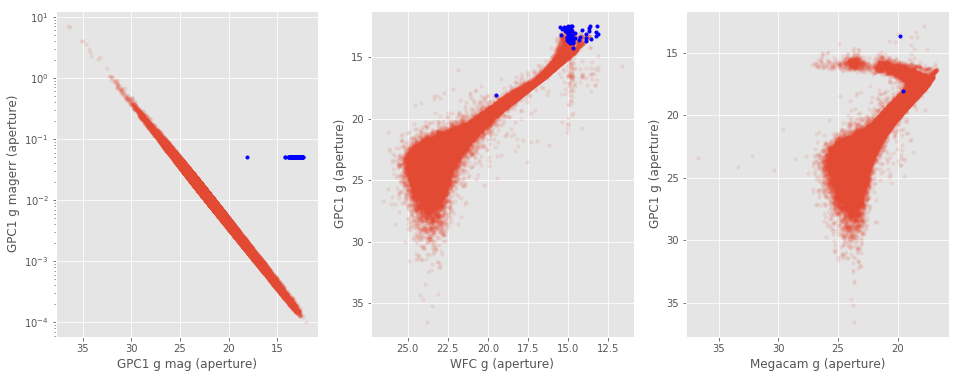

GPC1 r
   Number of flagged objects: 174


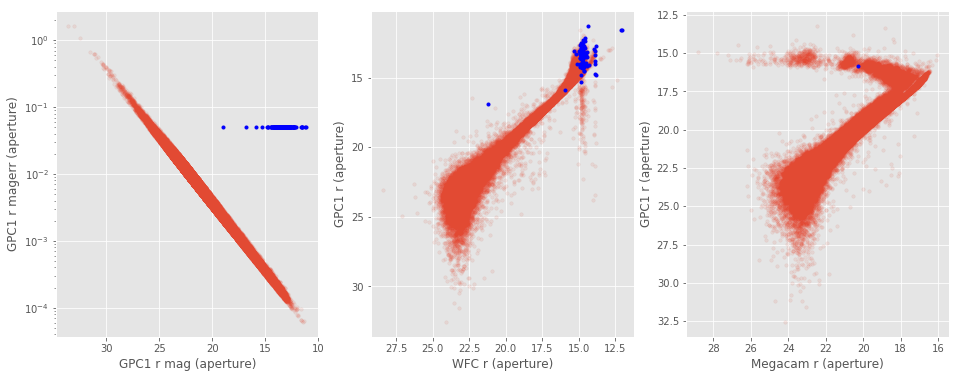

GPC1 i
   Number of flagged objects: 150


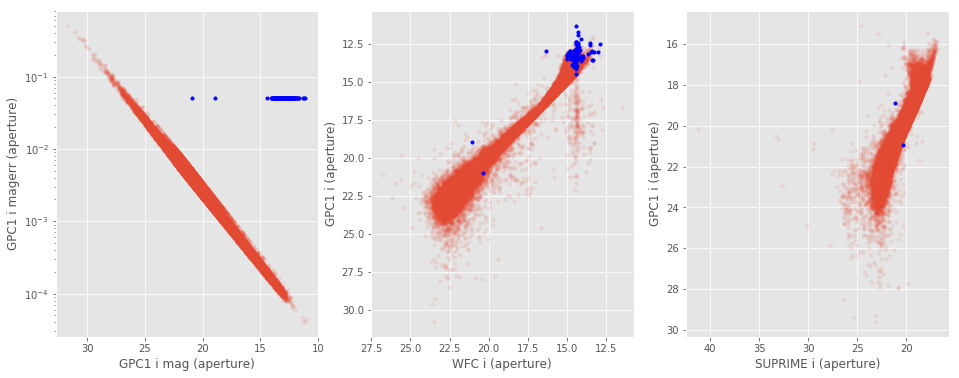

GPC1 z
   Number of flagged objects: 70


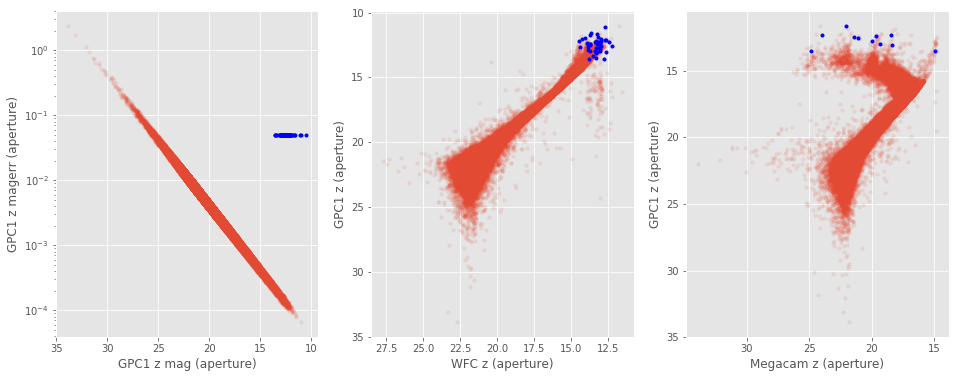

GPC1 y
   Number of flagged objects: 37


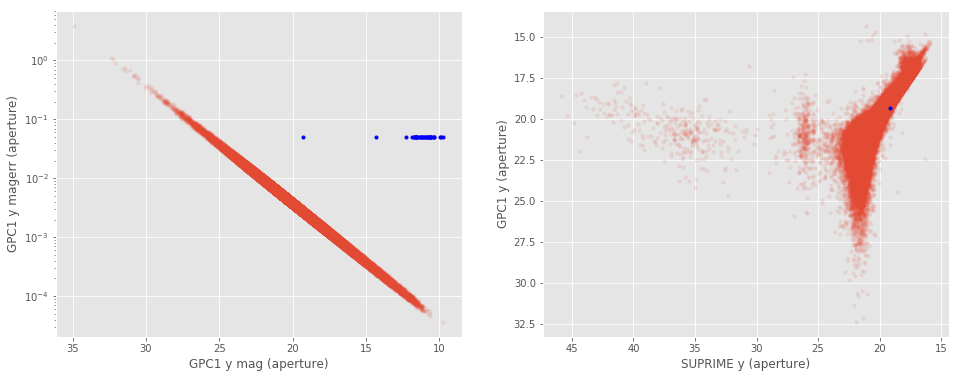

In [10]:
## Pan-STARRS stack cat 
ps1_err = 0.05000000074505806

bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
    col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_g':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)    
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    master_catalogue[col2], master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0])),
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.c IRAC Aperture magnitude

IRAC i1: Number of flagged objects: 79
IRAC i2: Number of flagged objects: 10


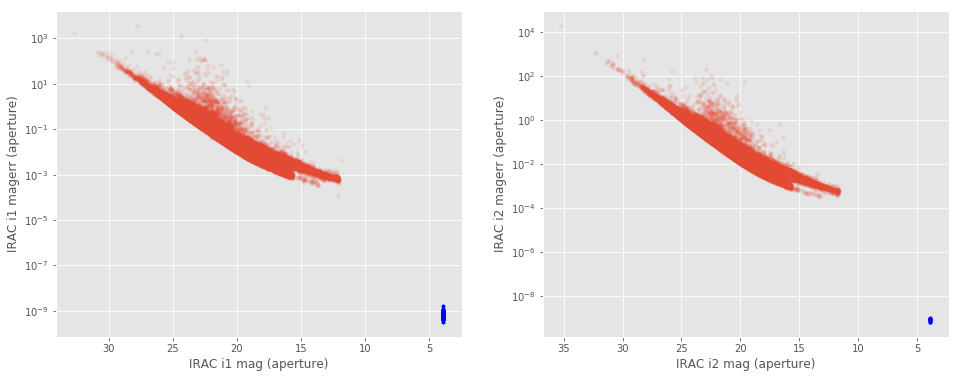

In [21]:
irac_mag = 3.9000000001085695

bands = ['IRAC i1', 'IRAC i2']
    
basecol1, basecol2 = bands[0].replace(" ", "_").lower(), bands[1].replace(" ", "_").lower()
col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
    
mask1 = np.where(master_catalogue[col1] == irac_mag)[0]   
print ('IRAC i1: Number of flagged objects:', len(master_catalogue[col1][mask1]))

mask2 = np.where(master_catalogue[col2] == irac_mag)[0]  
print ('IRAC i2: Number of flagged objects:', len(master_catalogue[col2][mask2]))

flag_mag(mask1, master_catalogue[col1], master_catalogue[ecol1],
         master_catalogue[col2], master_catalogue[ecol2], mask2=mask2,
         labels1=("{} mag (aperture)".format(bands[0]), "{} magerr (aperture)".format(bands[0])),
         labels2=("{} mag (aperture)".format(bands[1]), "{} magerr (aperture)".format(bands[1])),
         nb=1, savefig=True)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 5\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [22]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

Megacam u (aperture) - WFC u (aperture) (146134 sources):
- Median: 0.10
- Median Absolute Deviation: 0.24
- 1% percentile: -0.7272730255126953
- 99% percentile: 2.3119604682922468
Outliers separation: log(chi2) = 5.55
Number of outliers: 0



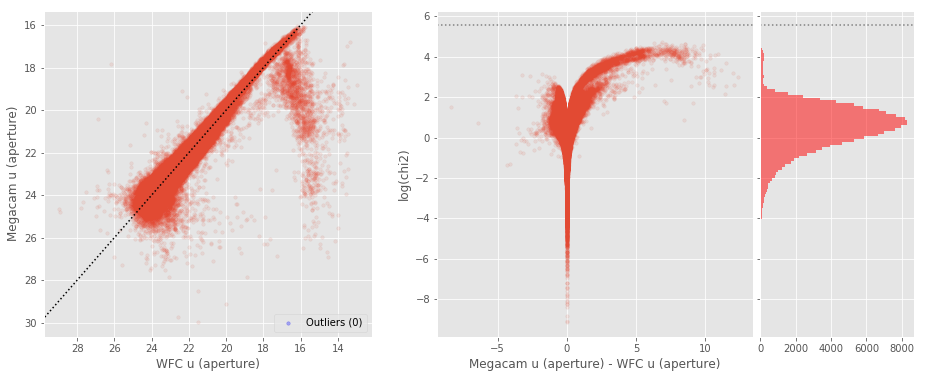

Megacam u (total) - WFC u (total) (146683 sources):
- Median: -0.15
- Median Absolute Deviation: 0.21
- 1% percentile: -1.0918270874023437
- 99% percentile: 2.1320125770568796
Outliers separation: log(chi2) = 5.38
Number of outliers: 0



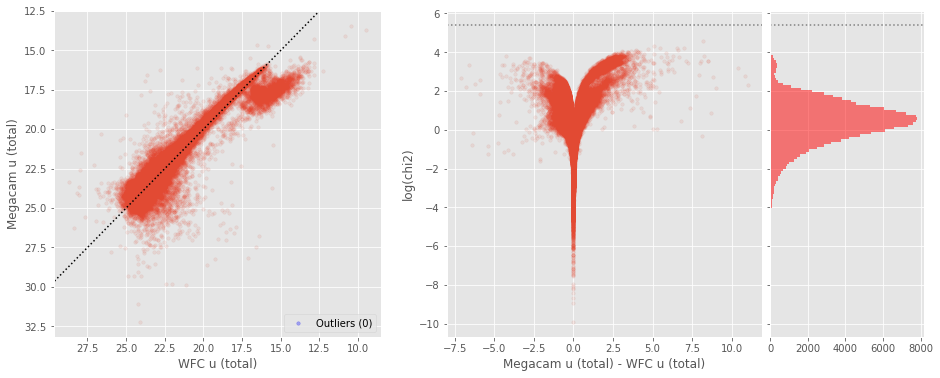

WFC g (aperture) - GPC1 g (aperture) (229563 sources):
- Median: 0.03
- Median Absolute Deviation: 0.25
- 1% percentile: -2.5988152694702147
- 99% percentile: 1.4681995010375977
Outliers separation: log(chi2) = 5.98
Number of outliers: 0



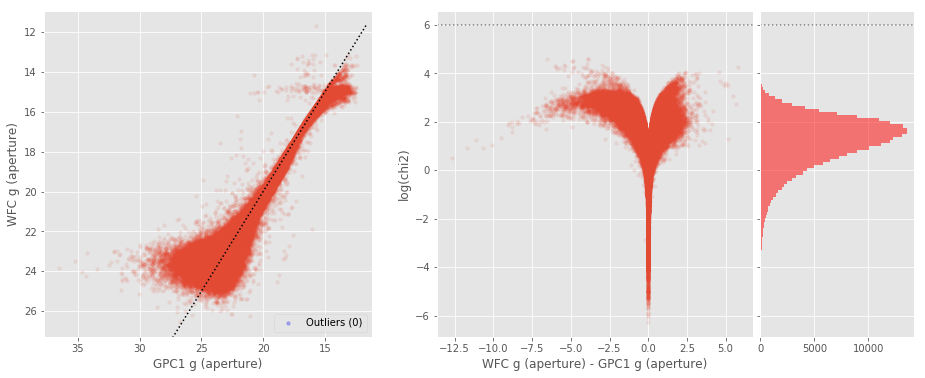

WFC g (total) - GPC1 g (total) (168099 sources):
- Median: -0.06
- Median Absolute Deviation: 0.15
- 1% percentile: -0.8852024841308593
- 99% percentile: 1.2358057785034149
Outliers separation: log(chi2) = 4.59
Number of outliers: 0



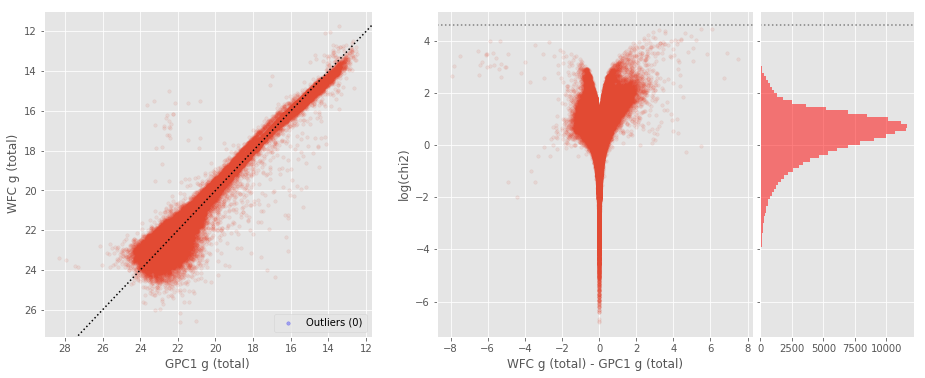

Megacam g (aperture) - GPC1 g (aperture) (208608 sources):
- Median: 0.19
- Median Absolute Deviation: 0.35
- 1% percentile: -2.5329534912109373
- 99% percentile: 2.7744883155822757
Outliers separation: log(chi2) = 7.41
Number of outliers: 0



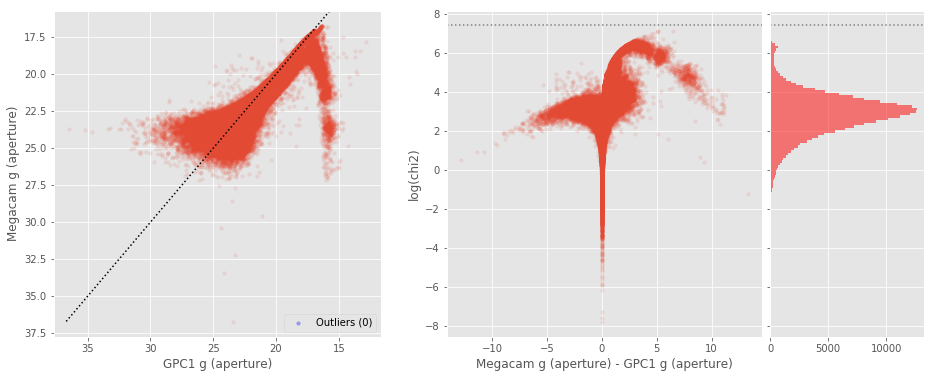

Megacam g (total) - GPC1 g (total) (149397 sources):
- Median: -0.08
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9098215484619141
- 99% percentile: 3.0532082366943376
Outliers separation: log(chi2) = 5.44
Number of outliers: 5600



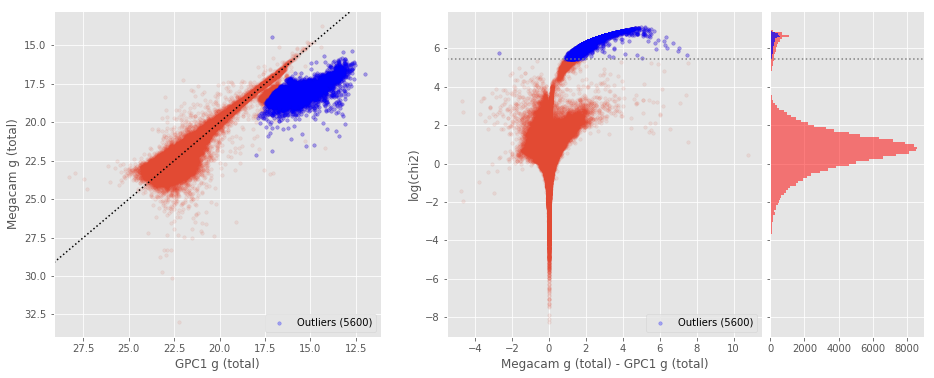

SUPRIME g (aperture) - GPC1 g (aperture) (138678 sources):
- Median: 0.25
- Median Absolute Deviation: 0.35
- 1% percentile: -2.513727512359619
- 99% percentile: 2.4509222221374523
Outliers separation: log(chi2) = 7.28
Number of outliers: 0



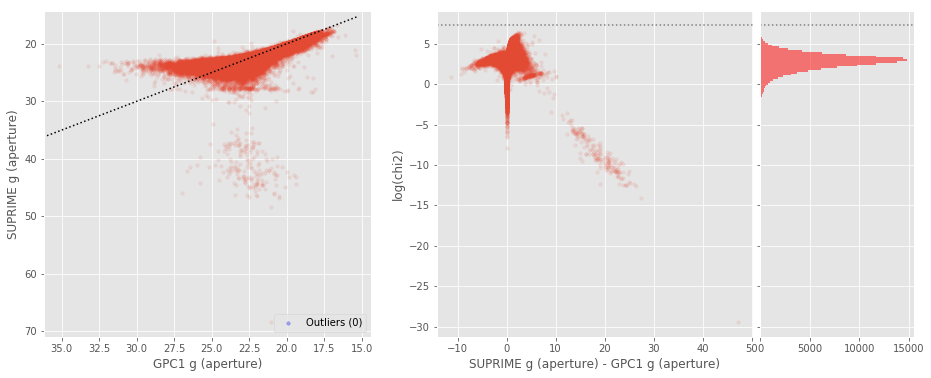

SUPRIME g (total) - GPC1 g (total) (94876 sources):
- Median: -0.01
- Median Absolute Deviation: 0.17
- 1% percentile: -0.8286709785461426
- 99% percentile: 1.6039471626281738
Outliers separation: log(chi2) = 4.98
Number of outliers: 50



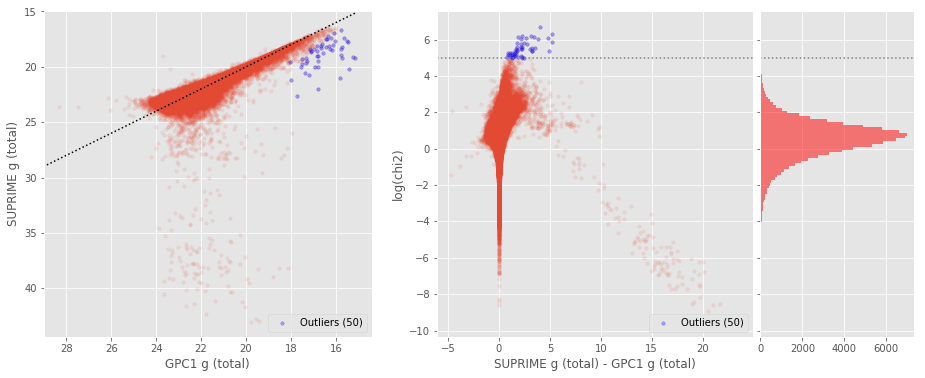

Megacam g (aperture) - WFC g (aperture) (525363 sources):
- Median: 0.14
- Median Absolute Deviation: 0.15
- 1% percentile: -0.5219296264648438
- 99% percentile: 1.085785179138184
Outliers separation: log(chi2) = 5.46
Number of outliers: 0



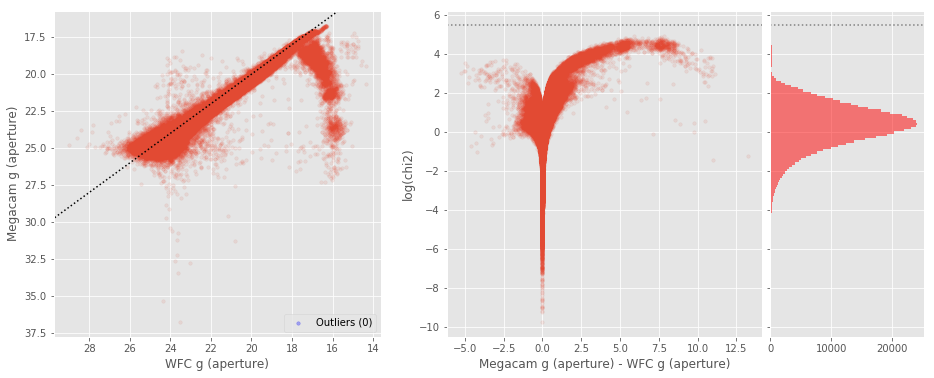

Megacam g (total) - WFC g (total) (528437 sources):
- Median: -0.02
- Median Absolute Deviation: 0.15
- 1% percentile: -0.9512448883056641
- 99% percentile: 1.8764633178711005
Outliers separation: log(chi2) = 4.57
Number of outliers: 36



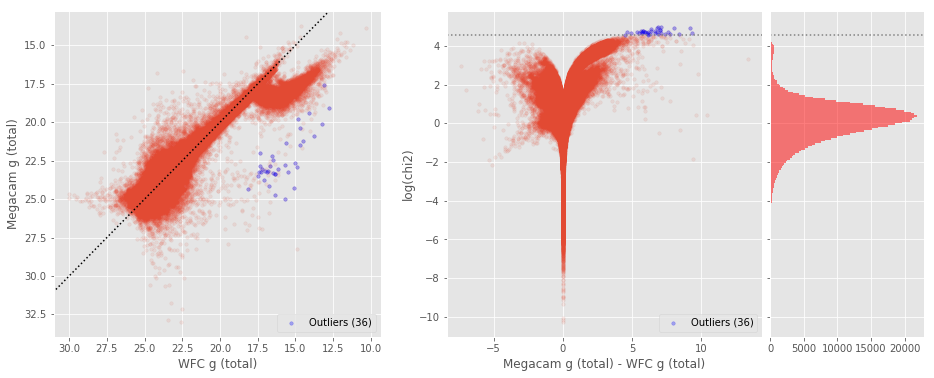

SUPRIME g (aperture) - WFC g (aperture) (378306 sources):
- Median: 0.16
- Median Absolute Deviation: 0.16
- 1% percentile: -0.5483207702636718
- 99% percentile: 2.319765567779542
Outliers separation: log(chi2) = 5.89
Number of outliers: 0



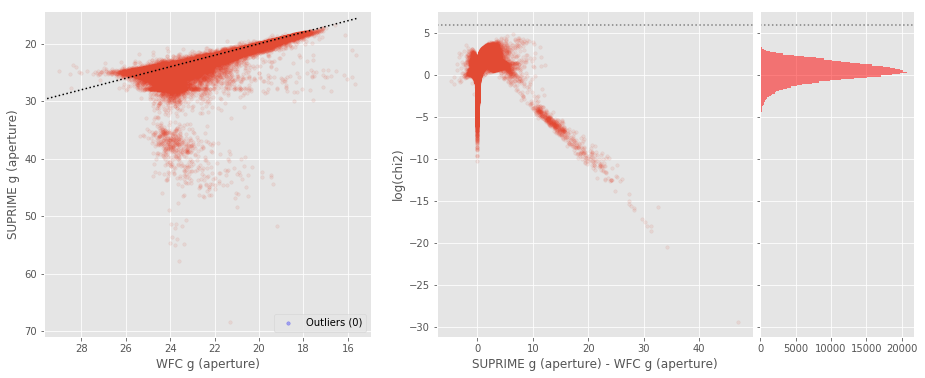

SUPRIME g (total) - WFC g (total) (375007 sources):
- Median: 0.01
- Median Absolute Deviation: 0.19
- 1% percentile: -0.9150347518920898
- 99% percentile: 2.3162221145629904
Outliers separation: log(chi2) = 4.66
Number of outliers: 6



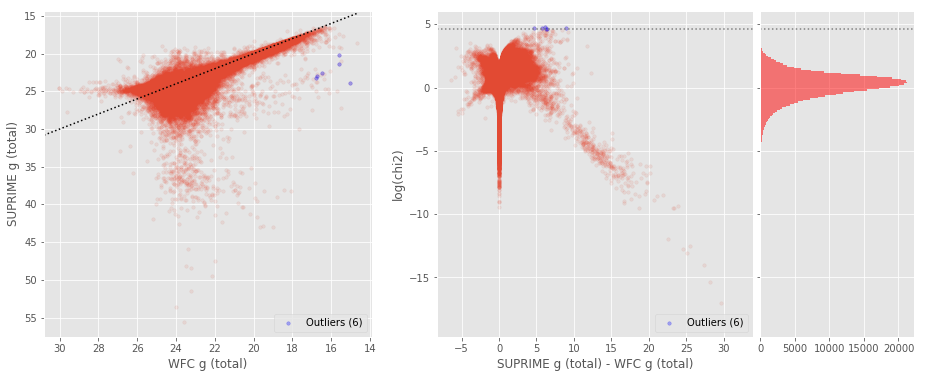

SUPRIME g (aperture) - Megacam g (aperture) (919881 sources):
- Median: -0.03
- Median Absolute Deviation: 0.11
- 1% percentile: -0.6601028442382812
- 99% percentile: 2.253218078613278
Outliers separation: log(chi2) = 5.36
Number of outliers: 55



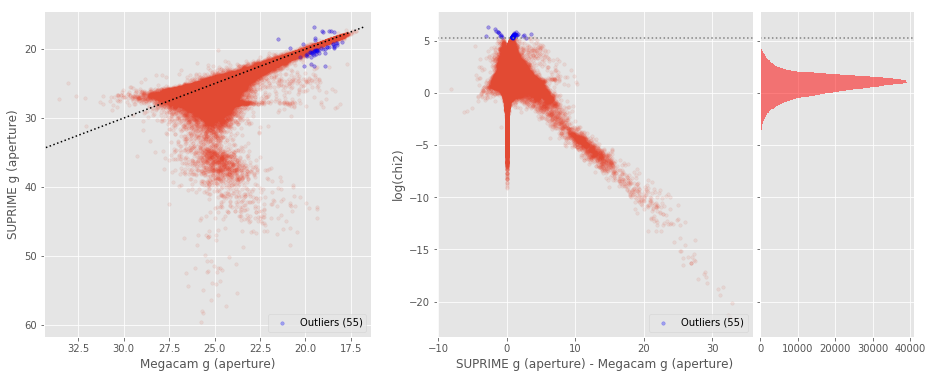

SUPRIME g (total) - Megacam g (total) (911242 sources):
- Median: -0.08
- Median Absolute Deviation: 0.20
- 1% percentile: -1.6537784385681151
- 99% percentile: 2.5875387001037593
Outliers separation: log(chi2) = 5.71
Number of outliers: 131



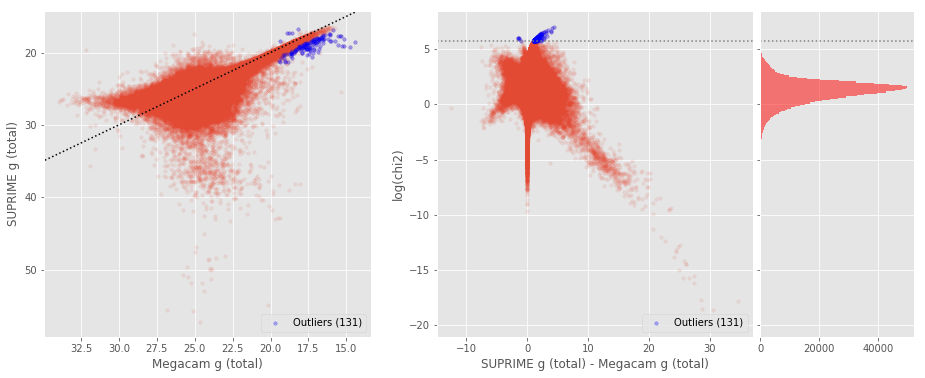

WFC r (aperture) - GPC1 r (aperture) (262366 sources):
- Median: 0.05
- Median Absolute Deviation: 0.14
- 1% percentile: -1.5338702201843262
- 99% percentile: 1.038834667205811
Outliers separation: log(chi2) = 5.72
Number of outliers: 0



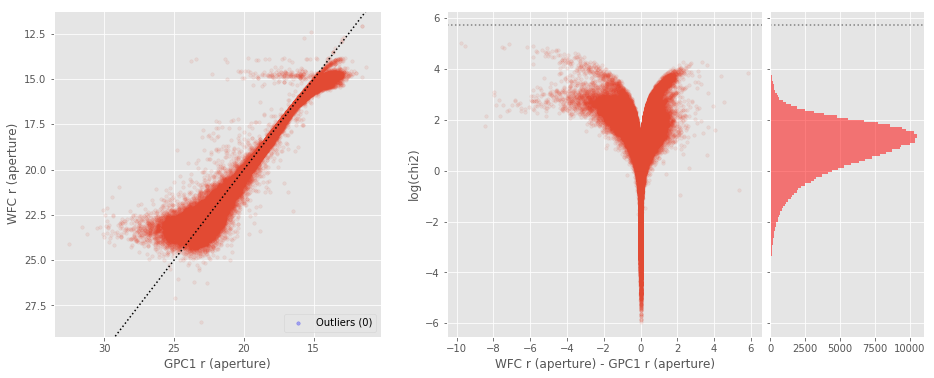

WFC r (total) - GPC1 r (total) (242340 sources):
- Median: -0.03
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8239599800109862
- 99% percentile: 0.9682998657226562
Outliers separation: log(chi2) = 4.59
Number of outliers: 0



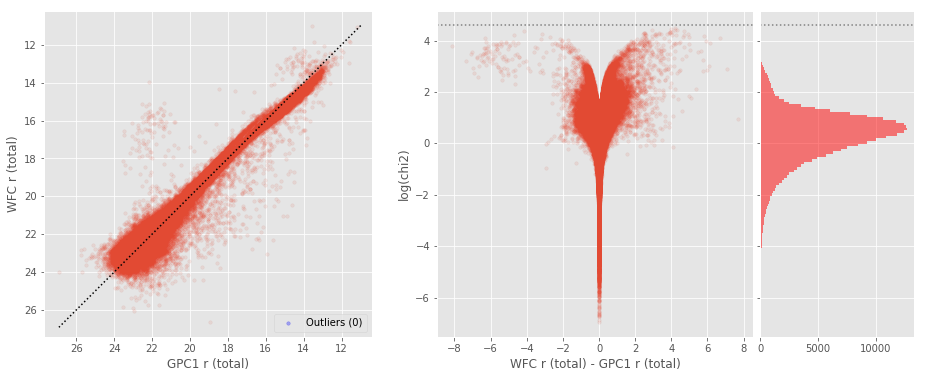

Megacam r (aperture) - GPC1 r (aperture) (226147 sources):
- Median: 0.16
- Median Absolute Deviation: 0.24
- 1% percentile: -1.457655601501465
- 99% percentile: 2.5137132263183606
Outliers separation: log(chi2) = 7.72
Number of outliers: 0



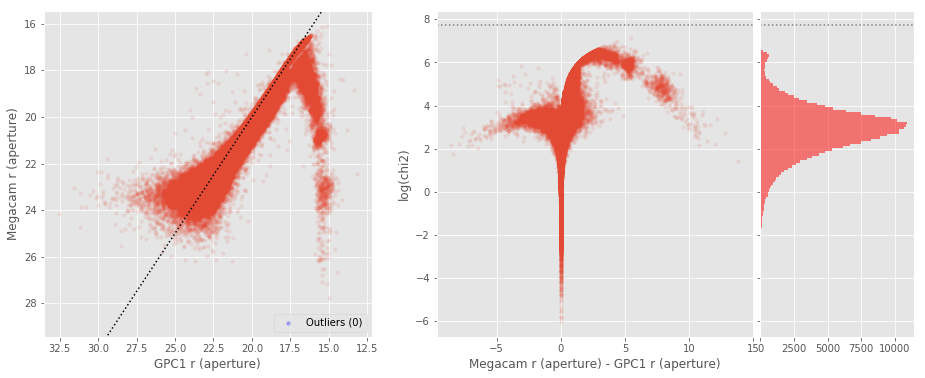

Megacam r (total) - GPC1 r (total) (210862 sources):
- Median: -0.11
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8498268508911133
- 99% percentile: 2.689556169509885
Outliers separation: log(chi2) = 5.46
Number of outliers: 6496



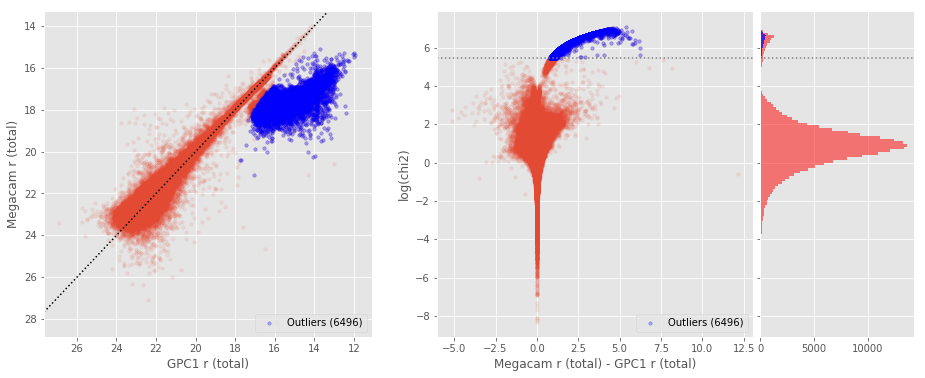

SUPRIME r (aperture) - GPC1 r (aperture) (149572 sources):
- Median: 0.16
- Median Absolute Deviation: 0.23
- 1% percentile: -1.4933876609802246
- 99% percentile: 2.941033477783204
Outliers separation: log(chi2) = 7.63
Number of outliers: 0



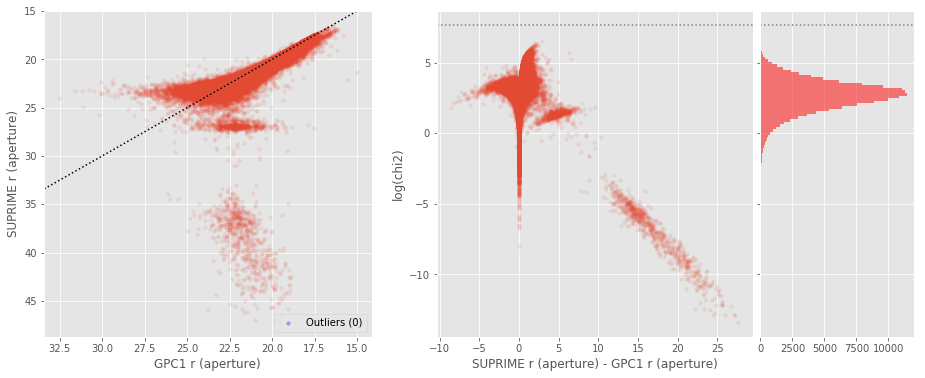

SUPRIME r (total) - GPC1 r (total) (136679 sources):
- Median: -0.06
- Median Absolute Deviation: 0.13
- 1% percentile: -0.7763473892211914
- 99% percentile: 2.7772662353515702
Outliers separation: log(chi2) = 4.95
Number of outliers: 87



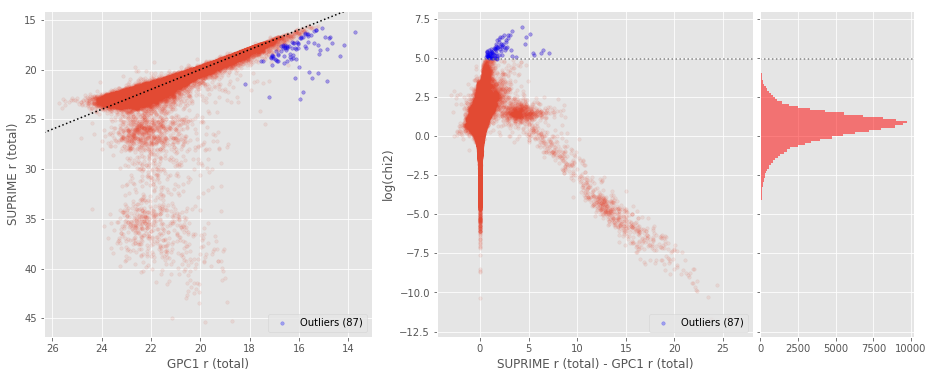

Megacam r (aperture) - WFC r (aperture) (506170 sources):
- Median: 0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -0.5586348533630371
- 99% percentile: 1.2267741394042968
Outliers separation: log(chi2) = 5.65
Number of outliers: 0



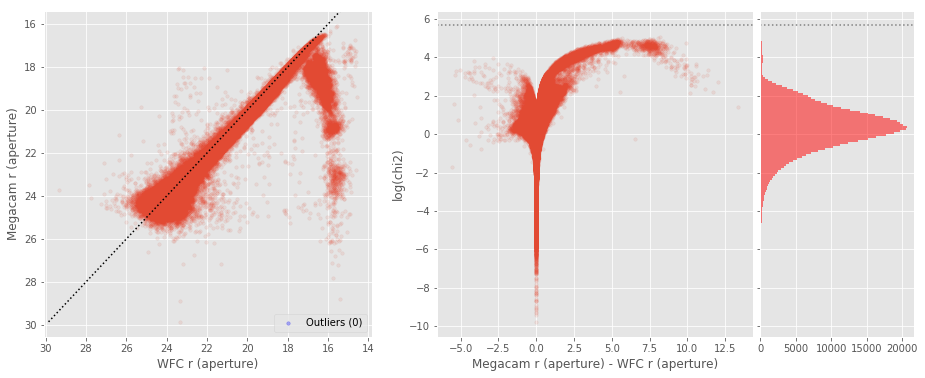

Megacam r (total) - WFC r (total) (509853 sources):
- Median: -0.07
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9979226684570313
- 99% percentile: 1.865820007324213
Outliers separation: log(chi2) = 4.85
Number of outliers: 21



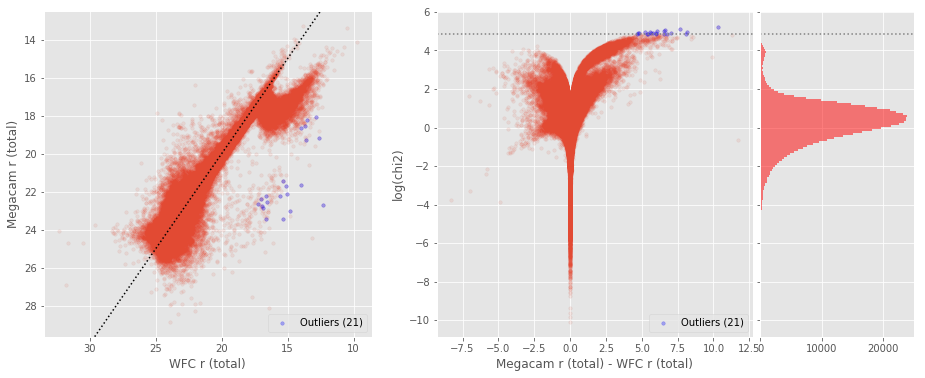

SUPRIME r (aperture) - WFC r (aperture) (359715 sources):
- Median: 0.09
- Median Absolute Deviation: 0.15
- 1% percentile: -0.6121792221069335
- 99% percentile: 3.5081581497192245
Outliers separation: log(chi2) = 5.68
Number of outliers: 0



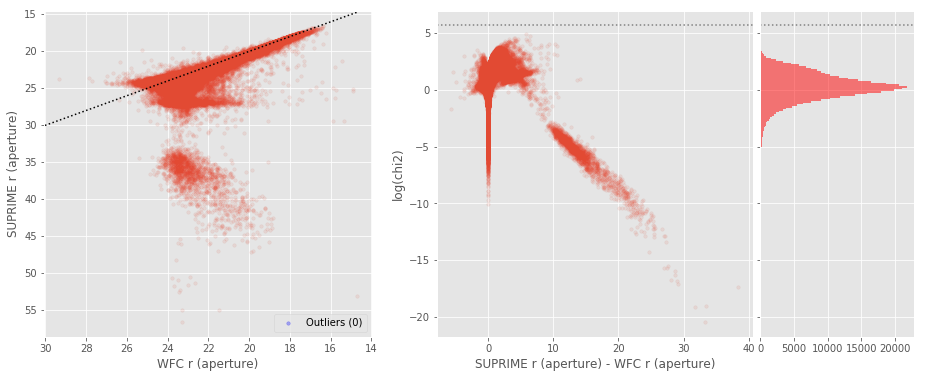

SUPRIME r (total) - WFC r (total) (356931 sources):
- Median: -0.05
- Median Absolute Deviation: 0.16
- 1% percentile: -0.9260368347167969
- 99% percentile: 3.344378280639652
Outliers separation: log(chi2) = 4.82
Number of outliers: 6



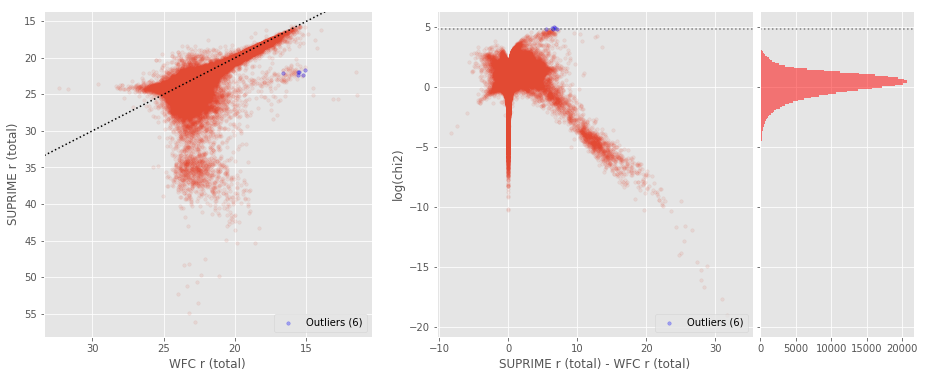

SUPRIME r (aperture) - Megacam r (aperture) (924837 sources):
- Median: -0.04
- Median Absolute Deviation: 0.11
- 1% percentile: -0.6416236114501953
- 99% percentile: 2.4894540405273453
Outliers separation: log(chi2) = 5.31
Number of outliers: 54



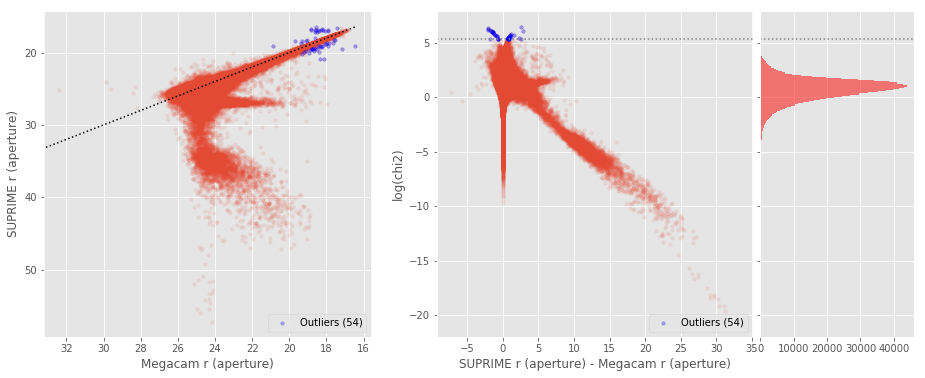

SUPRIME r (total) - Megacam r (total) (907574 sources):
- Median: -0.05
- Median Absolute Deviation: 0.20
- 1% percentile: -1.4620092201232913
- 99% percentile: 2.9623497581481937
Outliers separation: log(chi2) = 5.81
Number of outliers: 74



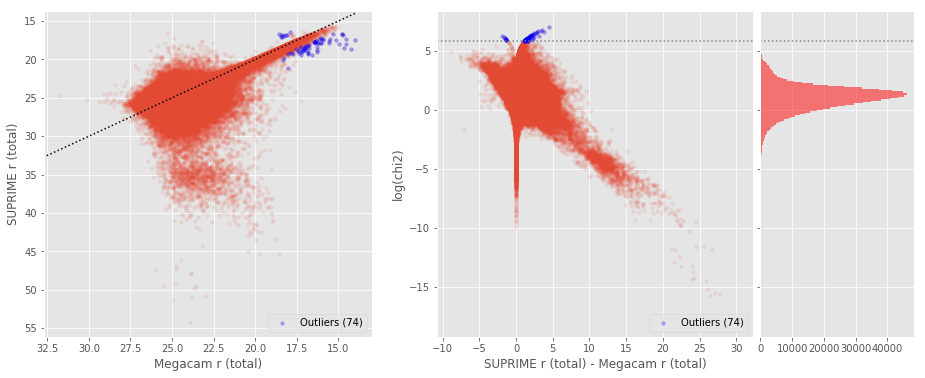

WFC i (aperture) - GPC1 i (aperture) (264066 sources):
- Median: 0.01
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7729697227478027
- 99% percentile: 0.7514700889587413
Outliers separation: log(chi2) = 4.98
Number of outliers: 0



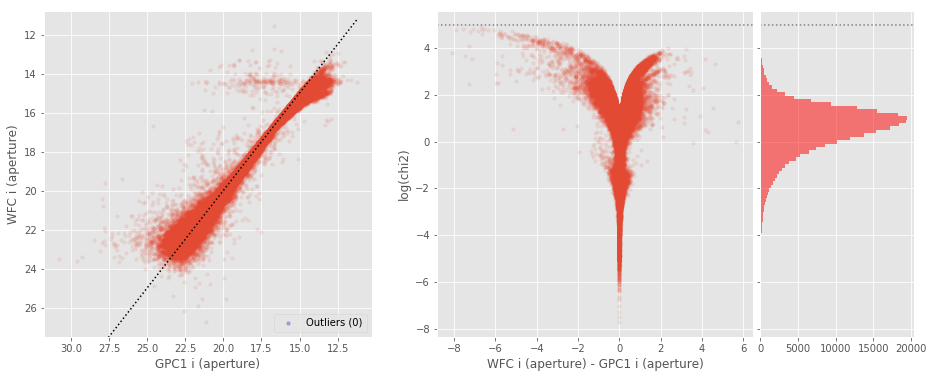

WFC i (total) - GPC1 i (total) (257933 sources):
- Median: -0.06
- Median Absolute Deviation: 0.11
- 1% percentile: -0.8199679565429687
- 99% percentile: 0.8002008056640625
Outliers separation: log(chi2) = 4.83
Number of outliers: 0



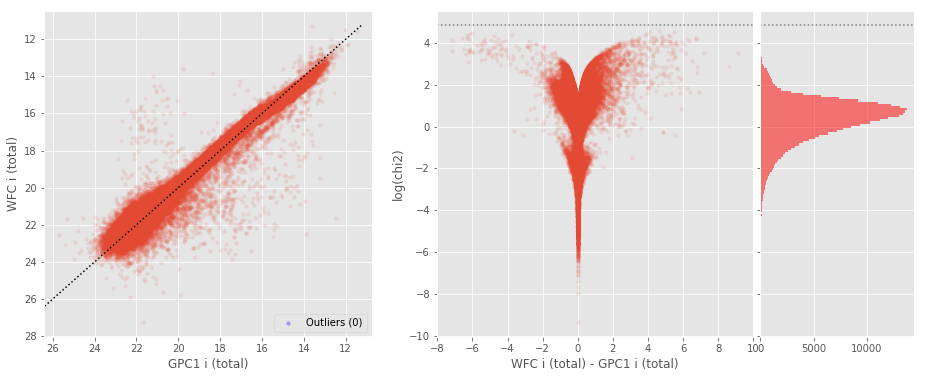

SUPRIME i (aperture) - GPC1 i (aperture) (152590 sources):
- Median: 0.09
- Median Absolute Deviation: 0.19
- 1% percentile: -0.6624540710449218
- 99% percentile: 1.2587196350097614
Outliers separation: log(chi2) = 7.78
Number of outliers: 0



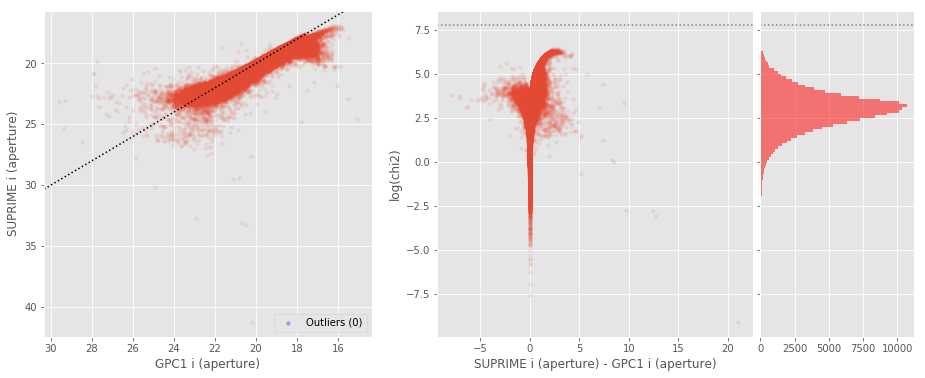

SUPRIME i (total) - GPC1 i (total) (148646 sources):
- Median: -0.18
- Median Absolute Deviation: 0.10
- 1% percentile: -0.6791705131530762
- 99% percentile: 1.033402633666992
Outliers separation: log(chi2) = 4.99
Number of outliers: 1053



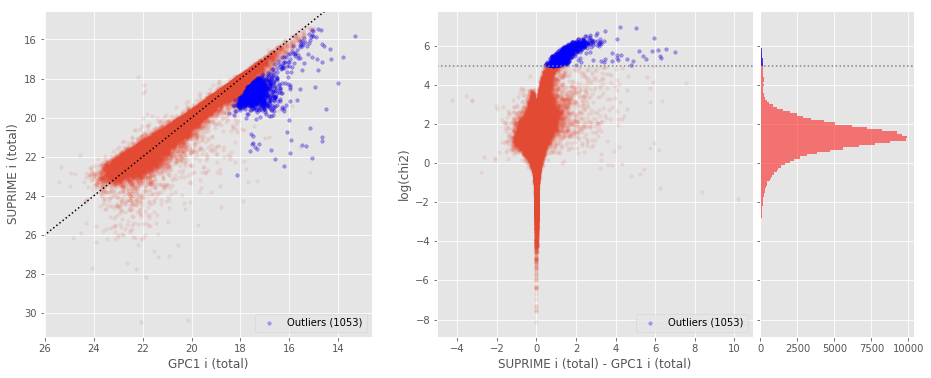

SUPRIME i (aperture) - WFC i (aperture) (334922 sources):
- Median: 0.07
- Median Absolute Deviation: 0.15
- 1% percentile: -0.7345022964477539
- 99% percentile: 1.4884132766723628
Outliers separation: log(chi2) = 5.28
Number of outliers: 0



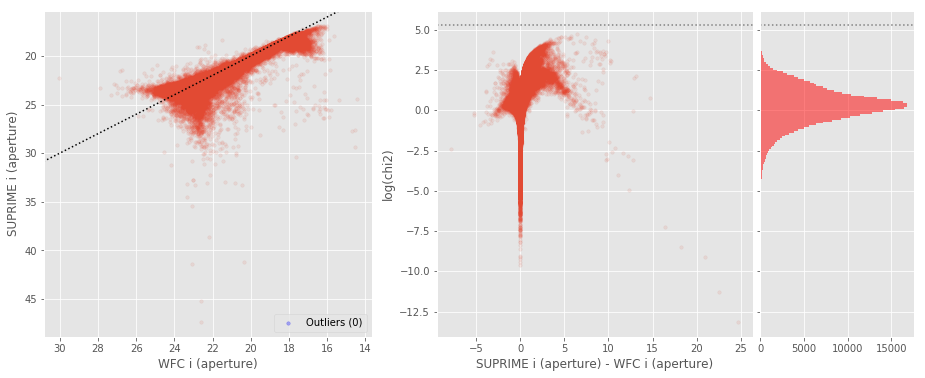

SUPRIME i (total) - WFC i (total) (331911 sources):
- Median: -0.13
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0118873596191407
- 99% percentile: 1.5839359283447343
Outliers separation: log(chi2) = 4.94
Number of outliers: 0



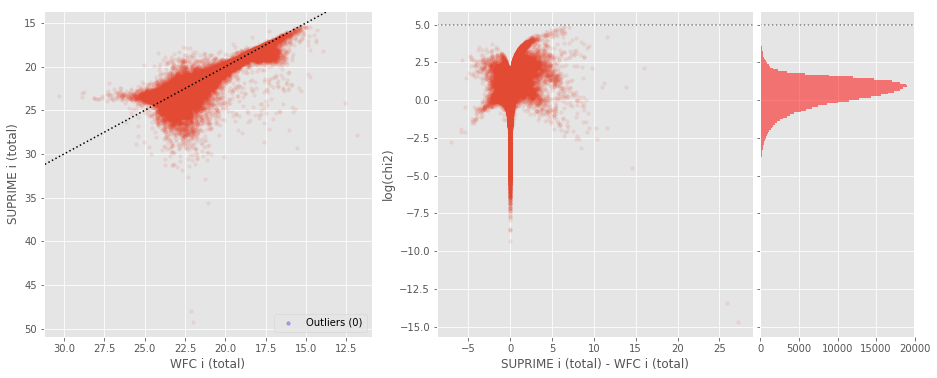

WFC z (aperture) - GPC1 z (aperture) (248005 sources):
- Median: -0.01
- Median Absolute Deviation: 0.15
- 1% percentile: -1.4084686279296876
- 99% percentile: 0.8958967590332023
Outliers separation: log(chi2) = 4.71
Number of outliers: 0



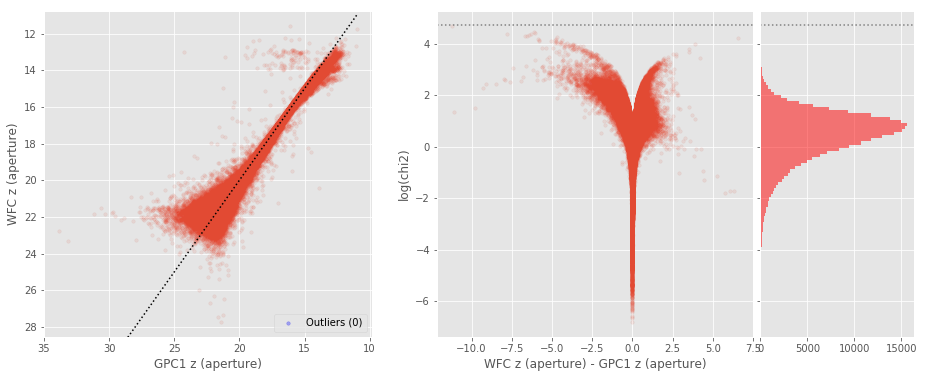

WFC z (total) - GPC1 z (total) (234531 sources):
- Median: -0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -1.361740493774414
- 99% percentile: 0.8547391891479516
Outliers separation: log(chi2) = 4.62
Number of outliers: 0



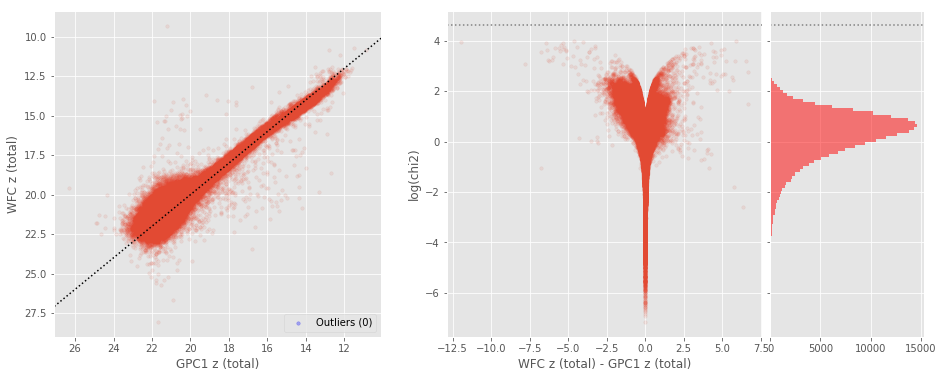

Megacam z (aperture) - GPC1 z (aperture) (219291 sources):
- Median: 0.09
- Median Absolute Deviation: 0.22
- 1% percentile: -1.3877744674682617
- 99% percentile: 3.8263822555542
Outliers separation: log(chi2) = 7.36
Number of outliers: 0



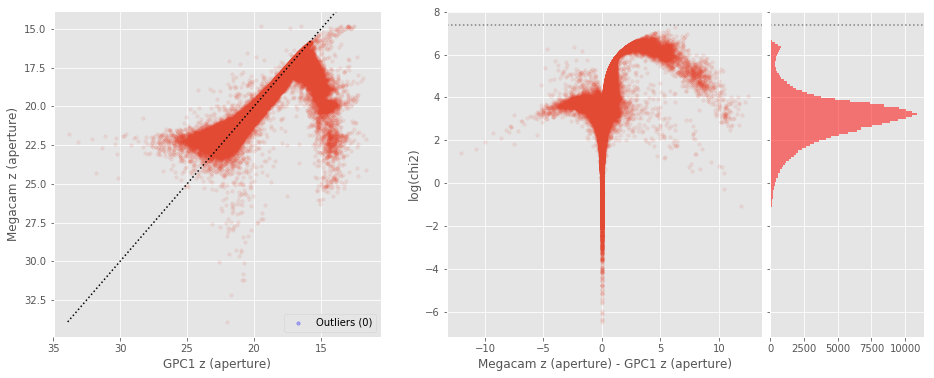

Megacam z (total) - GPC1 z (total) (203598 sources):
- Median: -0.17
- Median Absolute Deviation: 0.11
- 1% percentile: -0.9042765426635742
- 99% percentile: 2.2160144233703605
Outliers separation: log(chi2) = 5.90
Number of outliers: 4398



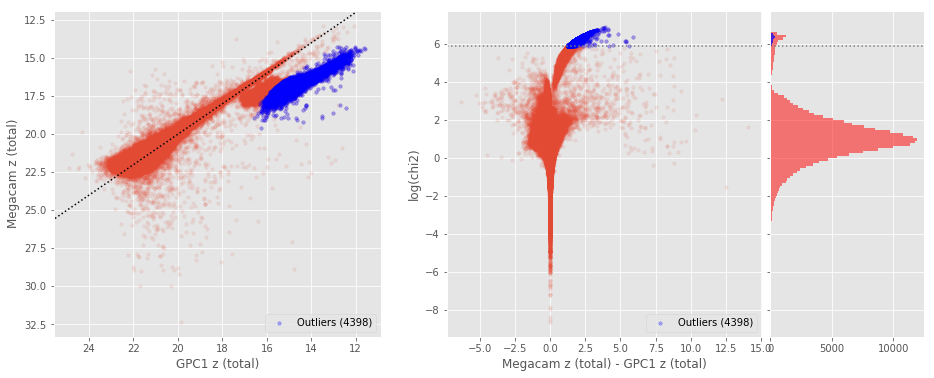

SUPRIME z (aperture) - GPC1 z (aperture) (151200 sources):
- Median: 0.05
- Median Absolute Deviation: 0.21
- 1% percentile: -1.4541193008422852
- 99% percentile: 1.0826468849182143
Outliers separation: log(chi2) = 7.17
Number of outliers: 0



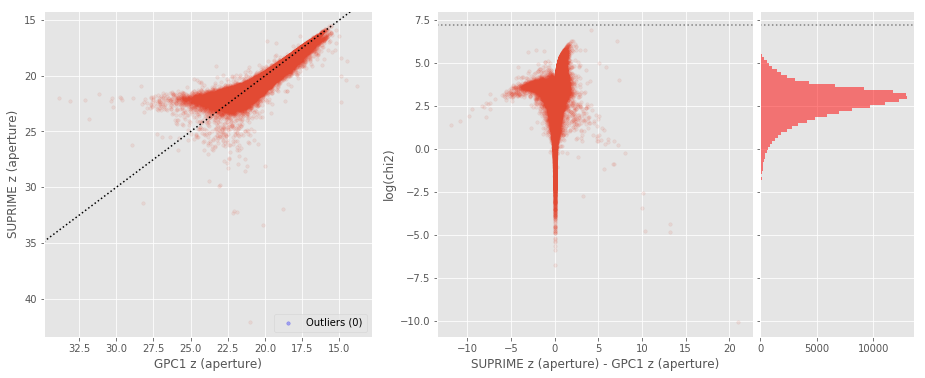

SUPRIME z (total) - GPC1 z (total) (138459 sources):
- Median: -0.13
- Median Absolute Deviation: 0.13
- 1% percentile: -0.833189811706543
- 99% percentile: 0.7019862365722678
Outliers separation: log(chi2) = 4.86
Number of outliers: 62



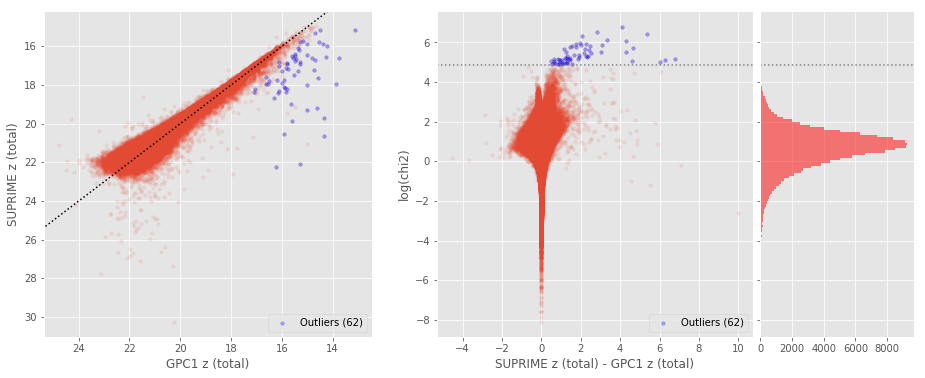

Megacam z (aperture) - WFC z (aperture) (274062 sources):
- Median: 0.13
- Median Absolute Deviation: 0.18
- 1% percentile: -0.7321368980407714
- 99% percentile: 3.3361961364746464
Outliers separation: log(chi2) = 5.42
Number of outliers: 0



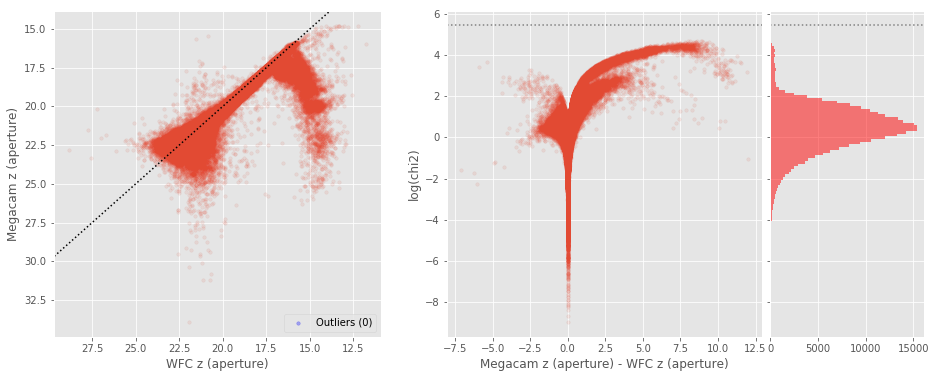

Megacam z (total) - WFC z (total) (275783 sources):
- Median: -0.07
- Median Absolute Deviation: 0.20
- 1% percentile: -0.9955057525634765
- 99% percentile: 2.3412176895141594
Outliers separation: log(chi2) = 4.94
Number of outliers: 0



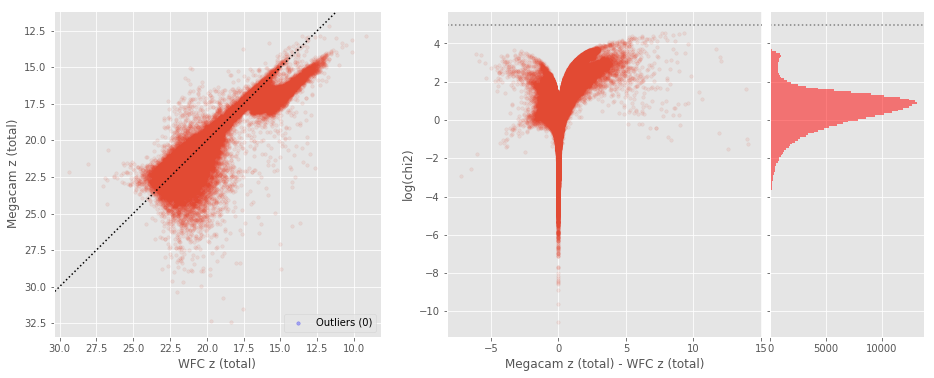

SUPRIME z (aperture) - WFC z (aperture) (204755 sources):
- Median: 0.10
- Median Absolute Deviation: 0.17
- 1% percentile: -0.7828456878662109
- 99% percentile: 2.590680770874016
Outliers separation: log(chi2) = 5.22
Number of outliers: 0



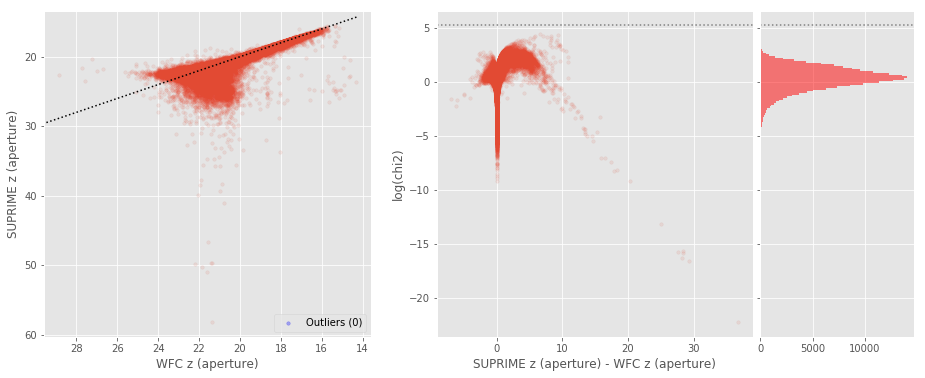

SUPRIME z (total) - WFC z (total) (203897 sources):
- Median: -0.03
- Median Absolute Deviation: 0.22
- 1% percentile: -0.9385904693603515
- 99% percentile: 2.620460052490243
Outliers separation: log(chi2) = 4.92
Number of outliers: 0



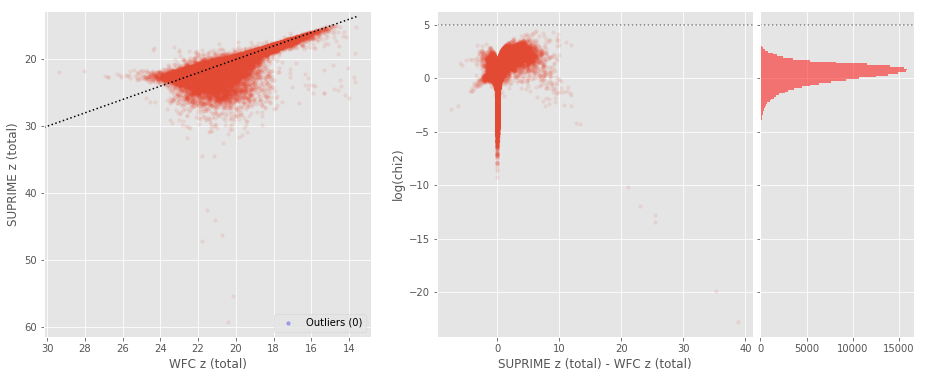

SUPRIME z (aperture) - Megacam z (aperture) (801007 sources):
- Median: -0.04
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1044315338134767
- 99% percentile: 1.5990334701538034
Outliers separation: log(chi2) = 5.47
Number of outliers: 157



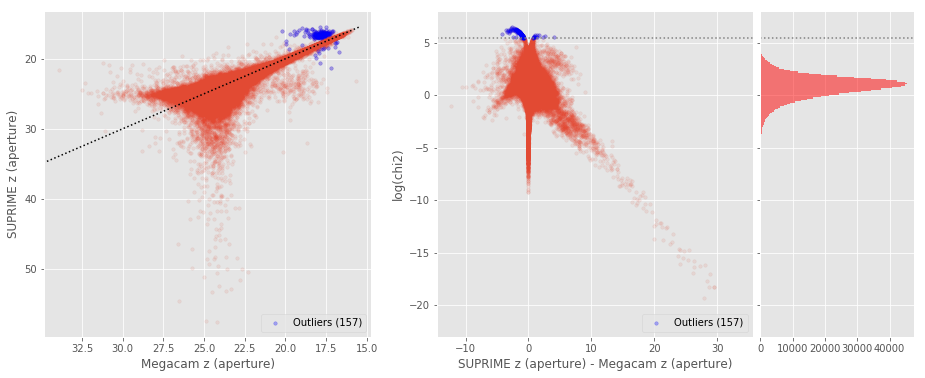

SUPRIME z (total) - Megacam z (total) (831386 sources):
- Median: -0.07
- Median Absolute Deviation: 0.28
- 1% percentile: -3.1019791603088382
- 99% percentile: 2.068734455108652
Outliers separation: log(chi2) = 5.92
Number of outliers: 67



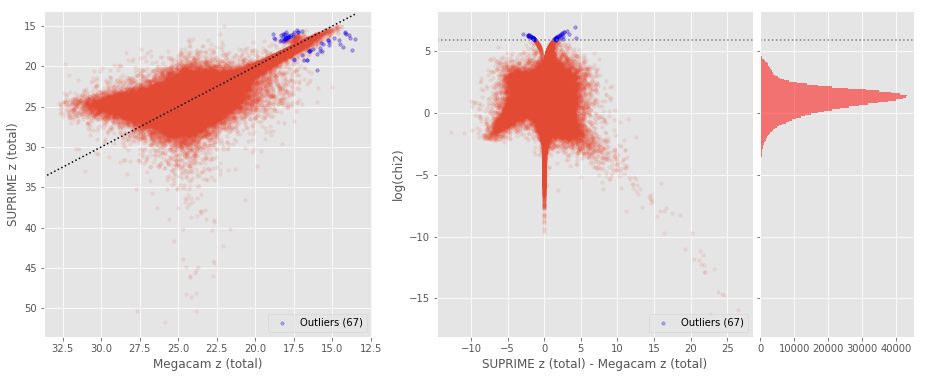

SUPRIME y (aperture) - GPC1 y (aperture) (143929 sources):
- Median: 0.11
- Median Absolute Deviation: 0.29
- 1% percentile: -2.540300674438477
- 99% percentile: 1.670090026855469
Outliers separation: log(chi2) = 7.24
Number of outliers: 0



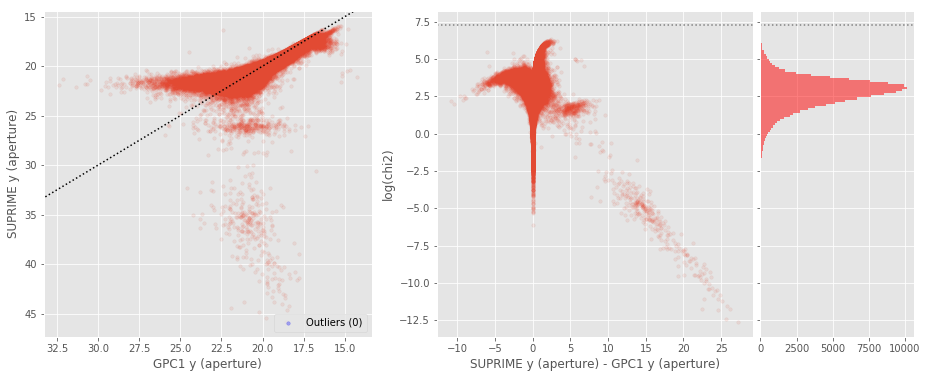

SUPRIME y (total) - GPC1 y (total) (96761 sources):
- Median: -0.20
- Median Absolute Deviation: 0.16
- 1% percentile: -1.0352184295654296
- 99% percentile: 1.1132595062255843
Outliers separation: log(chi2) = 5.02
Number of outliers: 88



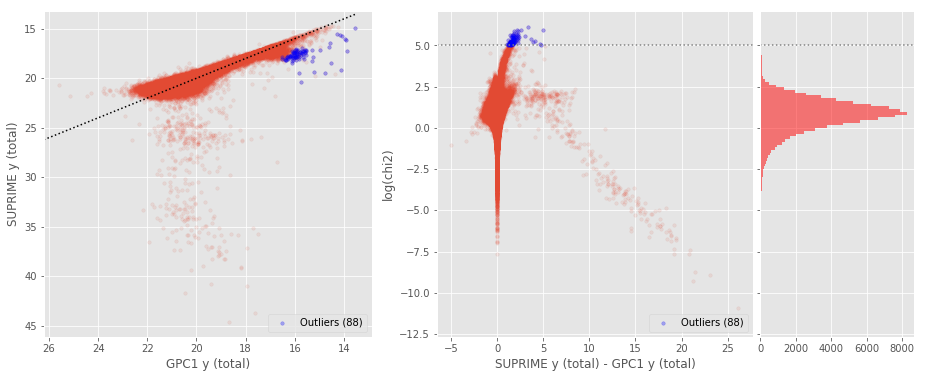

In [27]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "gpc1_i" and basecol2 == "suprime_i":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)))
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)), savefig=savefig)


## 4. Aperture correction issues

In [25]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    print(len(x[zoom]))
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

Megacam u (aperture) - WFC u (aperture):
9491


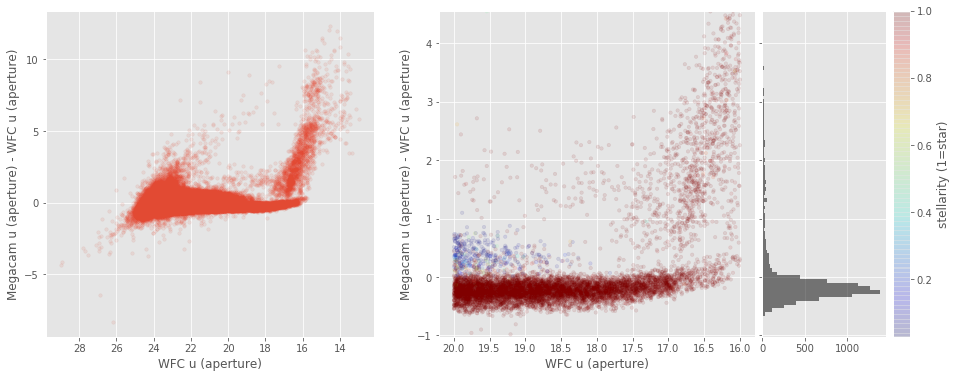

WFC g (aperture) - GPC1 g (aperture):
25129


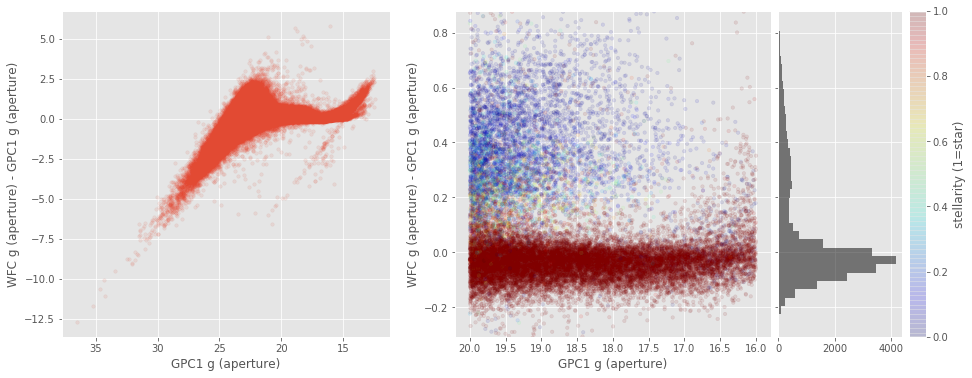

Megacam g (aperture) - GPC1 g (aperture):
22105


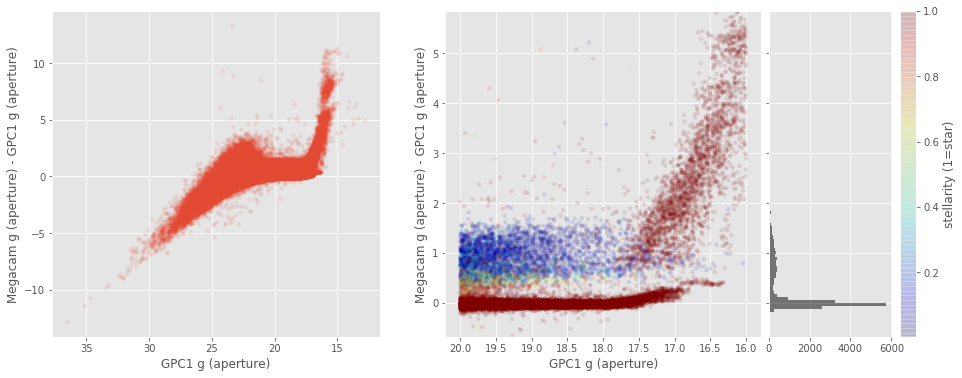

SUPRIME g (aperture) - GPC1 g (aperture):
8765


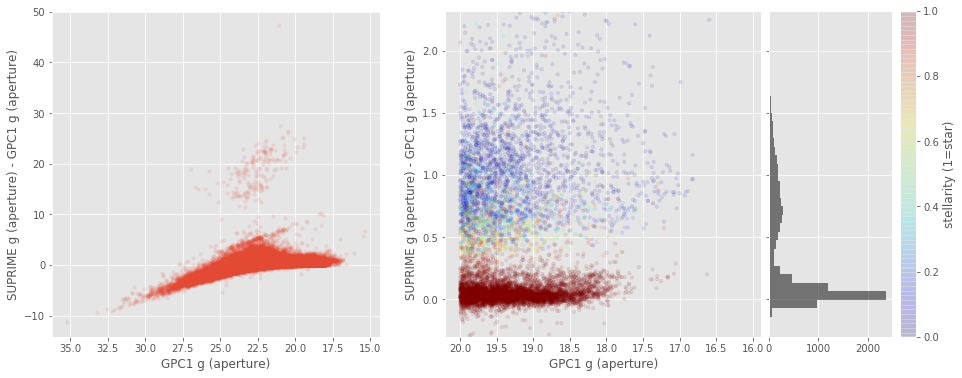

Megacam g (aperture) - WFC g (aperture):
19755


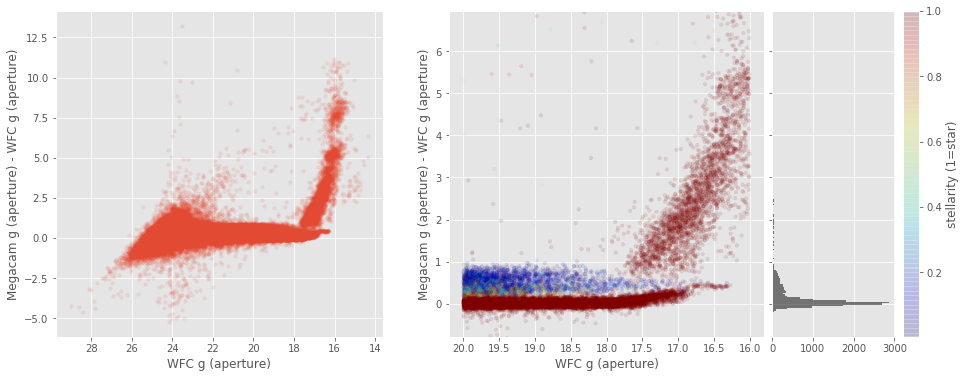

SUPRIME g (aperture) - WFC g (aperture):
7737


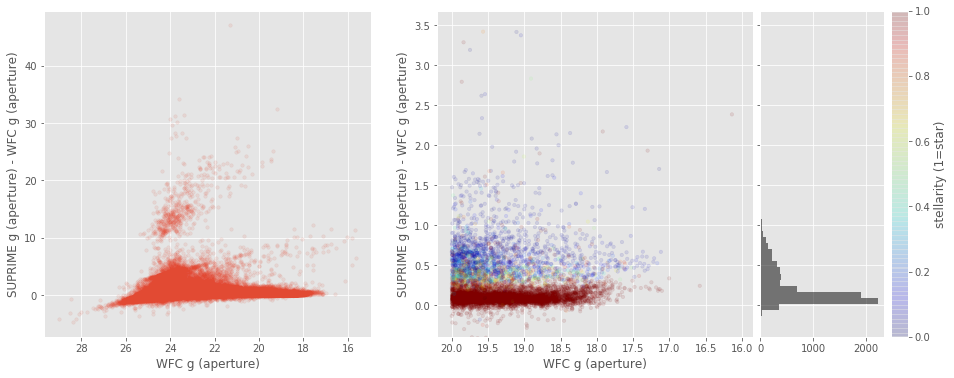

SUPRIME g (aperture) - Megacam g (aperture):
6833


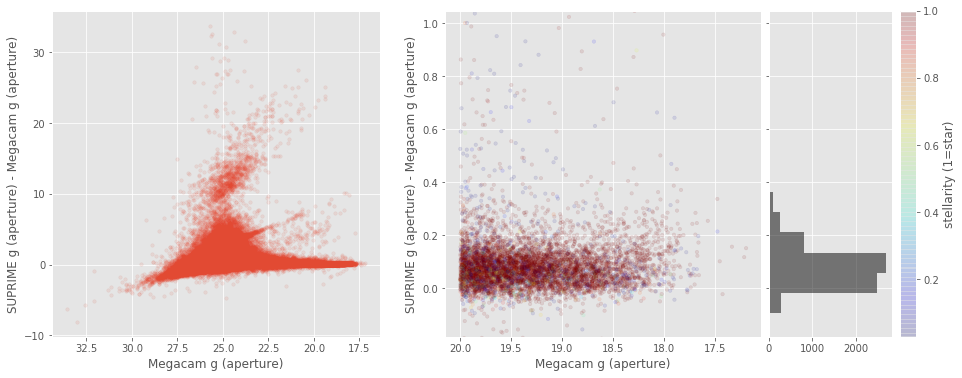

WFC r (aperture) - GPC1 r (aperture):
42590


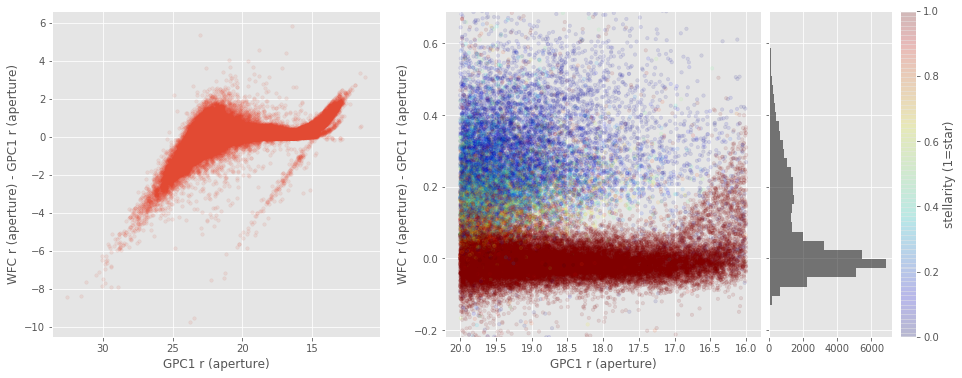

Megacam r (aperture) - GPC1 r (aperture):
37053


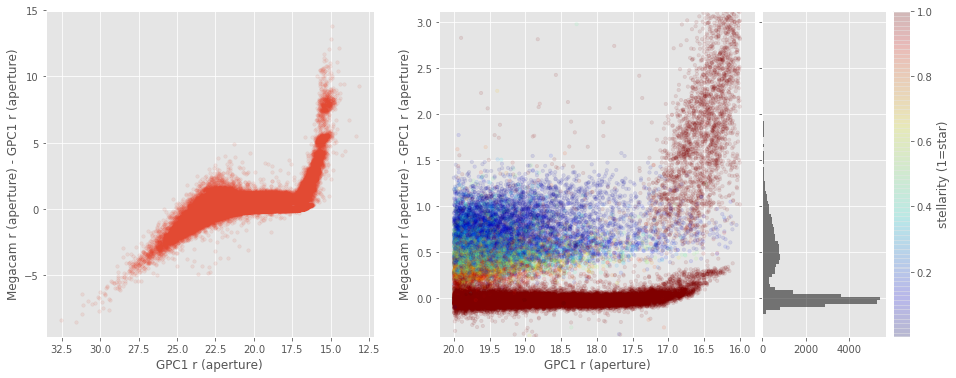

SUPRIME r (aperture) - GPC1 r (aperture):
19560


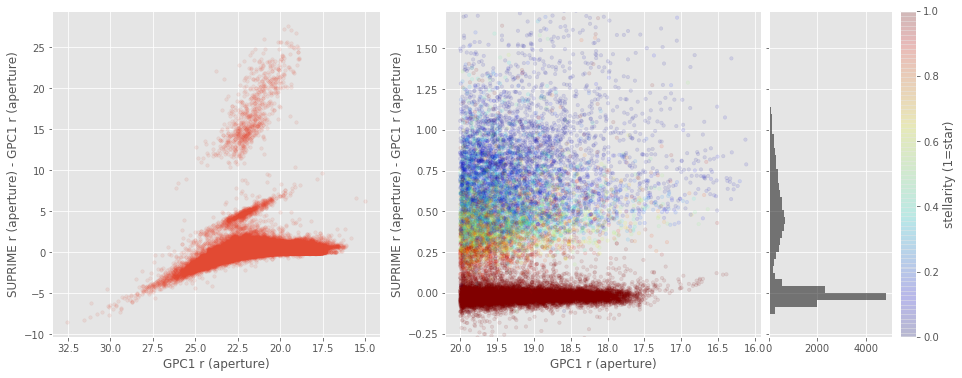

Megacam r (aperture) - WFC r (aperture):
33607


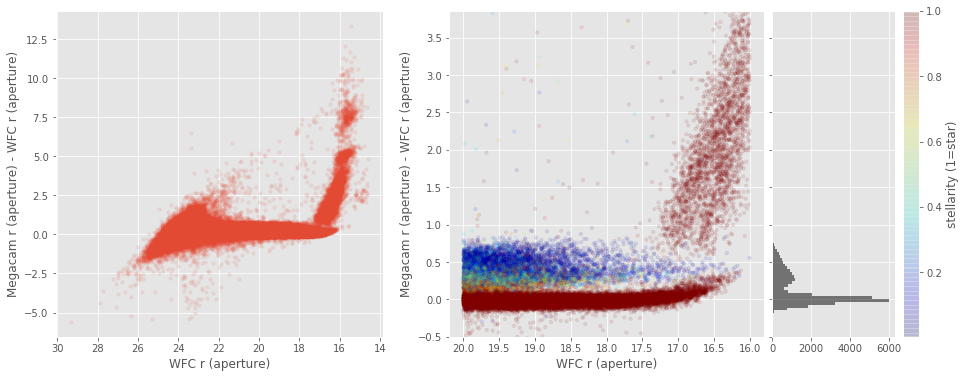

SUPRIME r (aperture) - WFC r (aperture):
17636


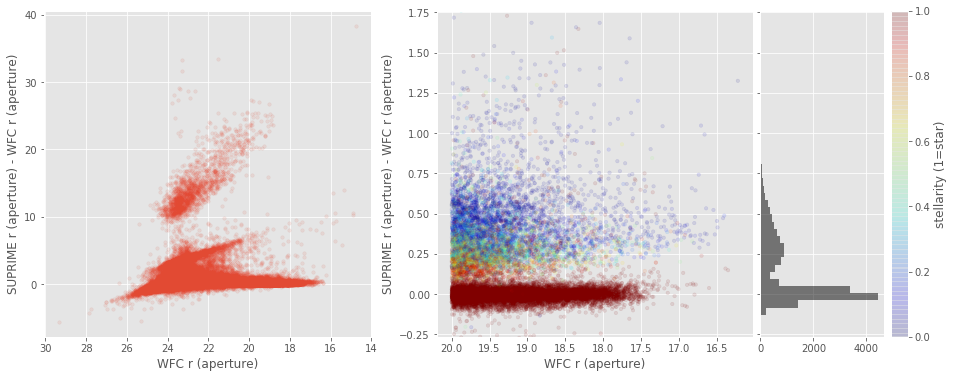

SUPRIME r (aperture) - Megacam r (aperture):
15314


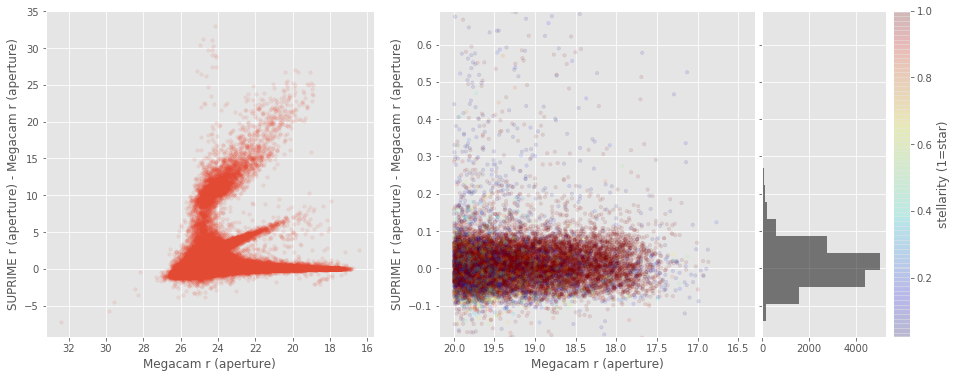

WFC i (aperture) - GPC1 i (aperture):
60729


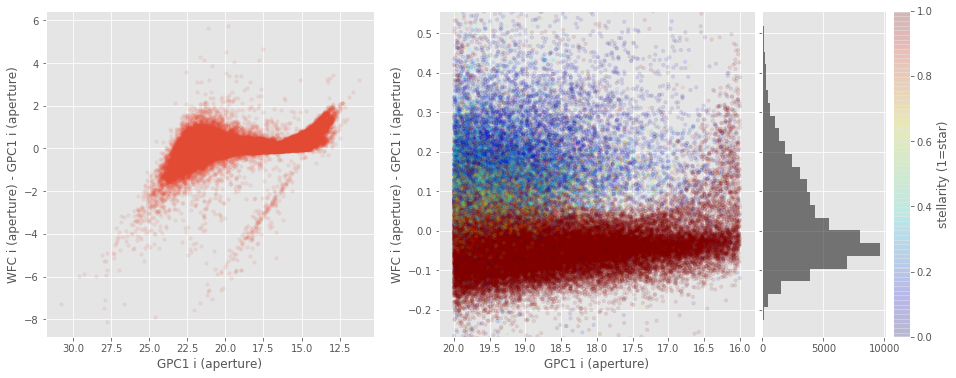

SUPRIME i (aperture) - GPC1 i (aperture):
31536


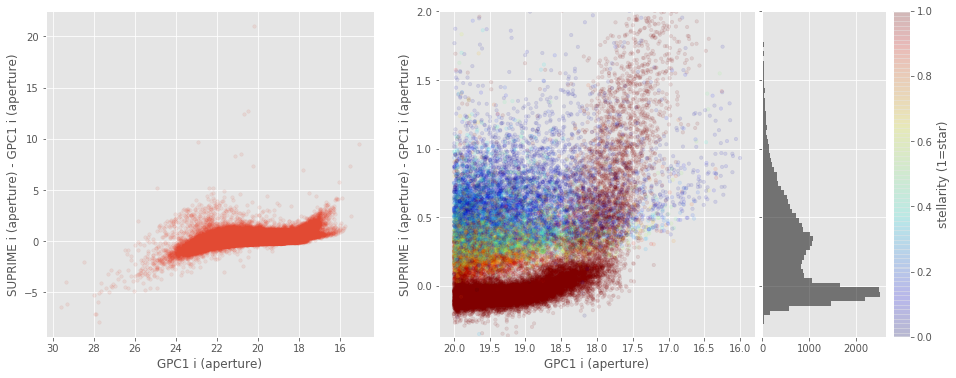

SUPRIME i (aperture) - WFC i (aperture):
29749


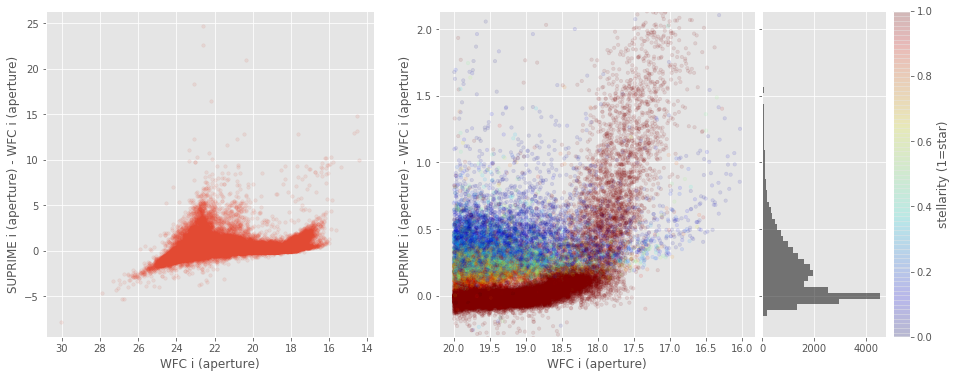

WFC z (aperture) - GPC1 z (aperture):
75888


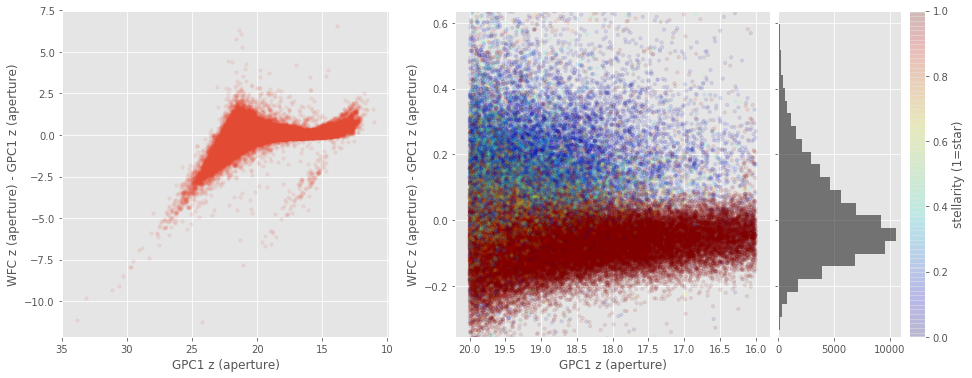

Megacam z (aperture) - GPC1 z (aperture):
63011


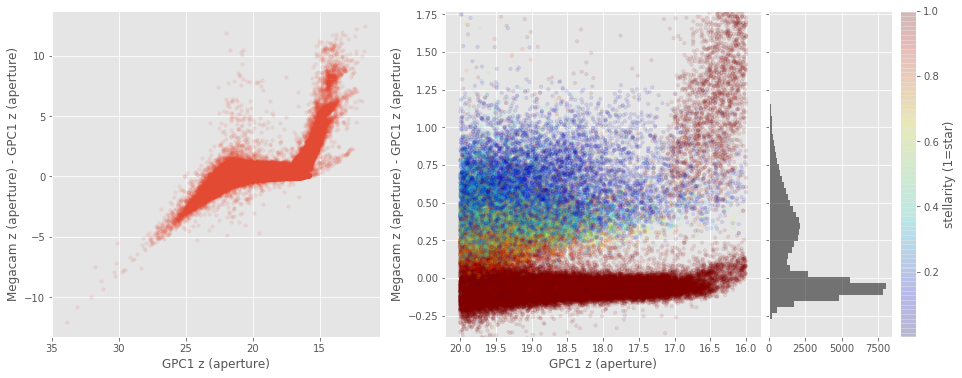

SUPRIME z (aperture) - GPC1 z (aperture):
40610


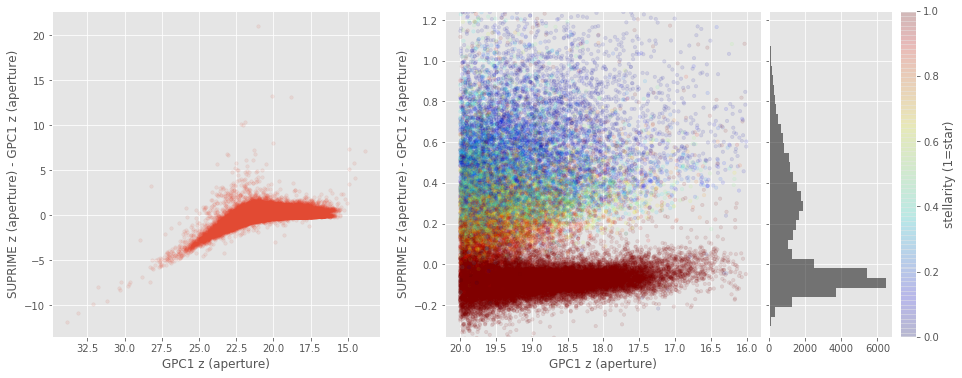

Megacam z (aperture) - WFC z (aperture):
60992


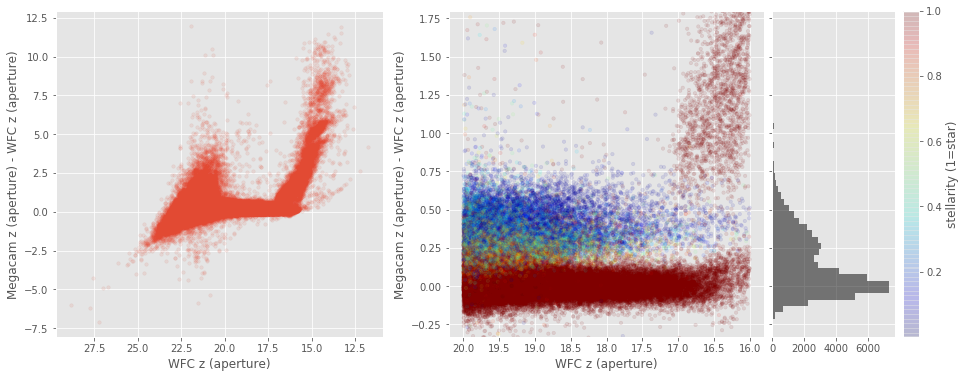

SUPRIME z (aperture) - WFC z (aperture):
39896


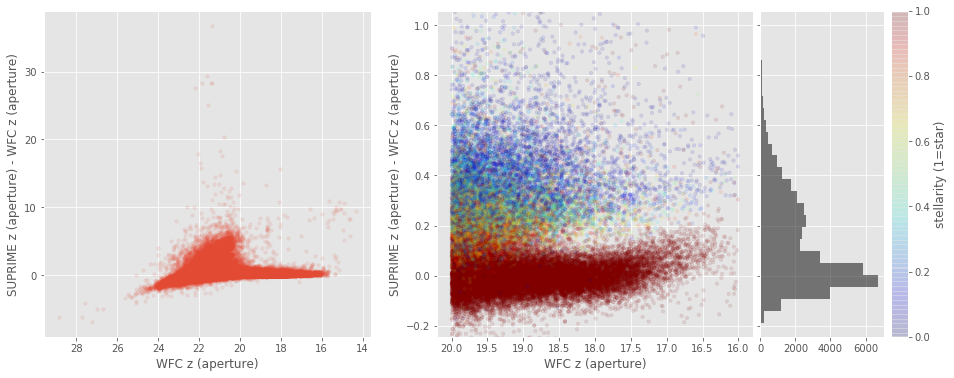

SUPRIME z (aperture) - Megacam z (aperture):
34493


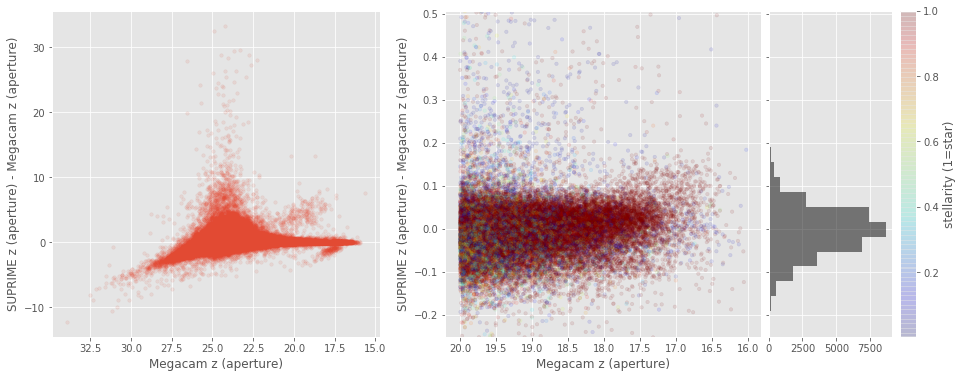

SUPRIME y (aperture) - GPC1 y (aperture):
47662


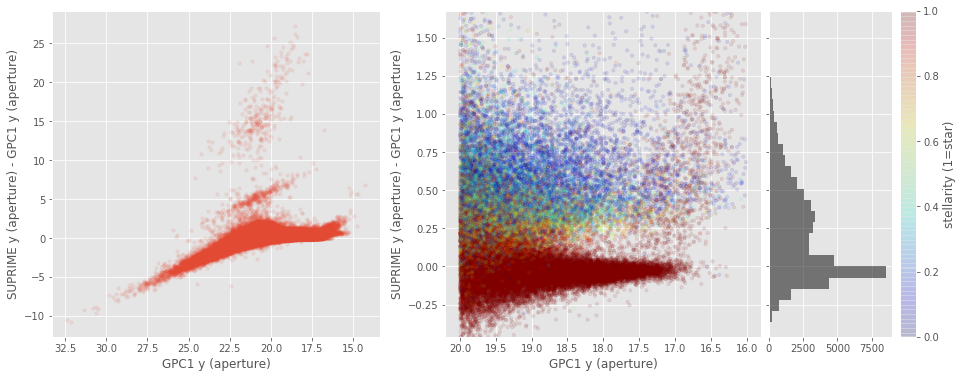

In [30]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if basecol1 == "gpc1_r" and basecol2 == "wfc_r":
            savefig = True
        else:
            savefig = False
            
        
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
